In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import accuracy_score, precision_score, recall_score, jaccard_score, f1_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm.autonotebook import tqdm

from sklearn.model_selection import train_test_split
import torch.nn as nn
from glob import glob
import torch
import torch.nn as nn
import torchvision
import os
import albumentations as A
from torchvision import transforms as T
from torch.utils.data import Dataset, DataLoader
from albumentations.pytorch import ToTensorV2
import torchvision
from torchvision.datasets import ImageFolder
from PIL import Image
seed = 42
import torch.nn.functional as F

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f'Currently using "{device}" device.')


Currently using "cuda" device.


In [4]:
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

batch_size = 5
image_size = 448
in_channels=3
num_classes = 1
epochs = 20
threshold=0.6
path = r'seg_model.pth'
dataset_name='crack-detection-dataset'

In [5]:
# from google.colab import drive
# drive.mount('/content/drive')

In [6]:
# import os
# os.environ['KAGGLE_CONFIG_DIR'] = '/content'

In [7]:
# os.getcwd()

In [8]:
# from google.colab import drive

# drive.mount('/content/gdrive/', force_remount=True)

In [9]:
# os.listdir(path_images)

In [10]:
# img=plt.imread("/kaggle/input/crack-detection-dataset/train/images/CFD_002.jpg")
# plt.imshow(img)

In [11]:
path_images = f'/kaggle/input/{dataset_name}/train/images'
path_masks = f'/kaggle/input/{dataset_name}/train/masks'

In [12]:
def img_mask_loading(path_images,path_masks):
    train_img_paths=[os.path.join(path_images,i) for i in os.listdir(path_images)]
    train_mask_paths=[os.path.join(path_masks,i) for i in os.listdir(path_masks)]
    train_img_paths = sorted([str(p) for p in train_img_paths])
    train_mask_paths = sorted([str(p) for p in train_mask_paths])
    return (train_img_paths,train_mask_paths)
    

In [13]:
train_img,train_mask=img_mask_loading(path_images,path_masks)
train_img[0],train_mask[0]

('/kaggle/input/crack-detection-dataset/train/images/CFD_002.jpg',
 '/kaggle/input/crack-detection-dataset/train/masks/CFD_002.jpg')

In [14]:
# plt.imshow(mask2)

In [15]:
# plt.imshow(img2)

In [16]:
# aug = A.HorizontalFlip(p=1)

In [17]:
df_train= pd.DataFrame({'images': train_img, 'masks': train_mask})

df_train.sample(2)

,images,masks
1056,/kaggle/input/crack-detection-dataset/train/im...,/kaggle/input/crack-detection-dataset/train/ma...
410,/kaggle/input/crack-detection-dataset/train/im...,/kaggle/input/crack-detection-dataset/train/ma...


## TRansformations 

In [18]:
train_transforms = T.Compose([
    T.ToPILImage(),
    T.Resize((image_size,image_size)),
    T.ToTensor()
])

In [19]:
# transforms=train_transforms(image=img1,mask=mask1)
# img2=transforms['image']
# mask2=transforms['mask']

In [20]:
img1 = plt.imread(f"/kaggle/input/{dataset_name}/train/images/CFD_002.jpg")

In [21]:
img1.shape

(448, 448, 3)

In [22]:
x=train_transforms(img1)

In [23]:
x.shape

torch.Size([3, 448, 448])

In [24]:
x

tensor([[[0.5294, 0.5098, 0.4863,  ..., 0.4941, 0.4824, 0.4627],
         [0.4980, 0.4863, 0.4863,  ..., 0.4863, 0.4627, 0.4392],
         [0.4706, 0.4667, 0.4745,  ..., 0.4784, 0.4471, 0.4196],
         ...,
         [0.2824, 0.2941, 0.2980,  ..., 0.4392, 0.4431, 0.4157],
         [0.2510, 0.2706, 0.2941,  ..., 0.4078, 0.3961, 0.3608],
         [0.2392, 0.2549, 0.2902,  ..., 0.3843, 0.3765, 0.3608]],

        [[0.5373, 0.5176, 0.4941,  ..., 0.5059, 0.4941, 0.4745],
         [0.5059, 0.4941, 0.4941,  ..., 0.4980, 0.4745, 0.4510],
         [0.4784, 0.4745, 0.4824,  ..., 0.4902, 0.4588, 0.4314],
         ...,
         [0.2863, 0.2980, 0.3020,  ..., 0.4353, 0.4392, 0.4118],
         [0.2549, 0.2745, 0.2980,  ..., 0.4039, 0.3922, 0.3569],
         [0.2431, 0.2588, 0.2941,  ..., 0.3804, 0.3725, 0.3569]],

        [[0.5255, 0.5059, 0.4824,  ..., 0.5255, 0.5137, 0.4941],
         [0.4941, 0.4824, 0.4824,  ..., 0.5176, 0.4941, 0.4706],
         [0.4667, 0.4627, 0.4706,  ..., 0.5098, 0.4784, 0.

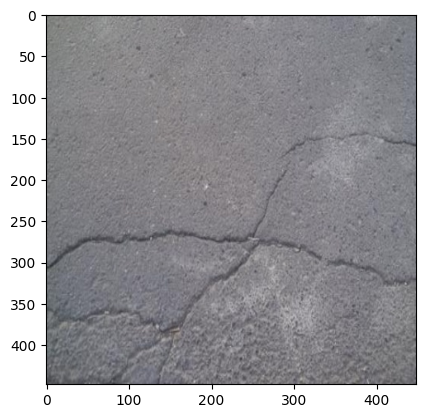

In [25]:
plt.imshow(x.permute(1,2,0))

In [26]:
train_transforms

Compose(
    ToPILImage()
    Resize(size=(448, 448), interpolation=bilinear, max_size=None, antialias=warn)
    ToTensor()
)

### Transformations

In [27]:
# random_crop = torchvision.transforms.RandomCrop((448, 448), fill=0, padding_mode='constant')

# # Apply the transform to your image
# cropped_image = random_crop(img1_tensor)

In [28]:
# plt.imshow(cropped_image.permute(1,2,0))

In [29]:
# cropped_image.shape

In [30]:
# x=train_transforms(img1)

## Dataset Loading

In [31]:
class CrackDataset(Dataset):
    def __init__(self, dataset, transforms=None):
        self.dataset = dataset.reset_index(drop=True)
        self.transforms = transforms
        
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, ix):
        row = self.dataset.loc[ix].squeeze()
        image_path = row['images']
        mask_path = row['masks']
        
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if self.transforms:
            image_tensor = self.transforms(image).float()
        else:
            image_tensor=T.ToPILImage()(image)
            image_tensor=T.ToTensor()((image_tensor))
            
       

        
        mask = cv2.imread(mask_path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
        mask = cv2.resize(mask, (image_size, image_size))
        _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
        mask=mask/255.0
            
        mask_tensor = torch.as_tensor(mask[None], dtype=torch.float32)
        
        # mask_tensor /= 255.
        
        return image_tensor, mask_tensor
    
#     def collate_fn(self, batch):
#         images, masks = tuple(zip(*batch))
#         images = [img[None] for img in images]
#         masks = [msk[None] for msk in masks]
#         images, masks = [torch.cat(i).to(device) for i in [images, masks]]
#         return images, masks

In [32]:
# from torch.utils.data import Dataset
# from torchvision import transforms as T
# import cv2

# class CrackDataset(Dataset):
#     def __init__(self, dataset, transforms=None, image_size=(image_size,image_size)):
#         self.dataset = dataset.reset_index(drop=True)
#         self.transforms = transforms
#         self.image_size = image_size
        
#     def __len__(self):
#         return len(self.dataset)
    
#     def __getitem__(self, ix):
#         row = self.dataset.loc[ix].squeeze()
#         image_path = row['images']
#         mask_path = row['masks']
        
#         image = cv2.imread(image_path)
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
#         mask = cv2.imread(mask_path)
#         mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
       
        
        
#         if self.transforms:
#             # Apply the same transformations to both image and mask
#             data = {'image': image, 'mask': mask}
#             augmented = self.transforms(image=image,mask=mask)
#             image = augmented['image']
#             mask = augmented['mask']

#         else:
#             image = T.ToPILImage()(image)
#             image = T.Resize(self.image_size)(image)
#             image = T.ToTensor()(image)
#         mask = cv2.resize(mask, (image_size, image_size))
#         _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
#         mask=mask/255.0
#         mask_tensor = torch.as_tensor(mask[None], dtype=torch.float32)

        

            
#         return image,mask
#     def collate_fn(self, batch):
#         images, masks = tuple(zip(*batch))
#         images = [img[None] for img in images]
#         masks = [msk[None] for msk in masks]
#         images, masks = [torch.cat(i).to(device) for i in [images, masks]]
#         return images, masks
            
            
       




In [33]:
# df_train['masks'][0]

In [34]:
# mask2=cv2.imread(df_train['masks'][0], cv2.IMREAD_GRAYSCALE)

In [35]:
# ((mask2>0)&(mask2<255)).sum()

In [36]:
train_dataset= CrackDataset(df_train,train_transforms)

In [37]:
train_dataset[12]

(tensor([[[0.5255, 0.4980, 0.4824,  ..., 0.2431, 0.3373, 0.4510],
          [0.5529, 0.5255, 0.4980,  ..., 0.2627, 0.3137, 0.3843],
          [0.5608, 0.5451, 0.5098,  ..., 0.2941, 0.2902, 0.3098],
          ...,
          [0.4549, 0.4196, 0.4157,  ..., 0.4941, 0.5686, 0.4706],
          [0.4078, 0.4196, 0.4275,  ..., 0.4902, 0.5725, 0.4471],
          [0.3725, 0.4196, 0.4353,  ..., 0.4745, 0.5569, 0.4118]],
 
         [[0.5333, 0.5059, 0.4902,  ..., 0.2745, 0.3686, 0.4824],
          [0.5608, 0.5333, 0.5059,  ..., 0.2941, 0.3451, 0.4157],
          [0.5686, 0.5529, 0.5176,  ..., 0.3255, 0.3216, 0.3412],
          ...,
          [0.4706, 0.4353, 0.4314,  ..., 0.5098, 0.5843, 0.4863],
          [0.4235, 0.4353, 0.4431,  ..., 0.5059, 0.5882, 0.4627],
          [0.3882, 0.4353, 0.4510,  ..., 0.4902, 0.5725, 0.4275]],
 
         [[0.5294, 0.5020, 0.4863,  ..., 0.2824, 0.3765, 0.4902],
          [0.5569, 0.5294, 0.5020,  ..., 0.3020, 0.3529, 0.4235],
          [0.5647, 0.5490, 0.5137,  ...,

In [38]:
# (train_dataset[1][1]==1.0).sum()

In [39]:
z=train_dataset[12]
z[0].shape

torch.Size([3, 448, 448])

In [40]:
((z[1]>0)&(z[1]<1)).sum()

tensor(0)

In [41]:
z[1].shape

torch.Size([1, 448, 448])

In [42]:
# z=z[0].detach().cpu().numpy()

In [43]:
# (z[1]>1).sum()

In [44]:
def show_one(image,mask):
    plt.subplot(121)
    plt.imshow(image.cpu().detach().numpy().transpose(1,2,0))
    plt.subplot(122)
    plt.imshow(mask.cpu().detach().numpy().transpose(1,2,0), cmap='gray')

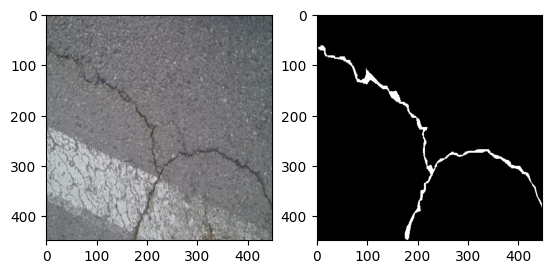

In [45]:
show_one(z[0],z[1])

## valid dataset

In [46]:
v_path_images = f'/kaggle/input/{dataset_name}/test/images'
v_path_masks = f'/kaggle/input/{dataset_name}/test/masks'


In [47]:
valid_img,valid_mask=img_mask_loading(v_path_images,v_path_masks)

In [48]:
valid_img[0],valid_mask[0]

('/kaggle/input/crack-detection-dataset/test/images/CFD_001.jpg',
 '/kaggle/input/crack-detection-dataset/test/masks/CFD_001.jpg')

In [49]:
df_valid= pd.DataFrame({'images': valid_img, 'masks': valid_mask})

df_valid.sample(2)

,images,masks
746,/kaggle/input/crack-detection-dataset/test/ima...,/kaggle/input/crack-detection-dataset/test/mas...
671,/kaggle/input/crack-detection-dataset/test/ima...,/kaggle/input/crack-detection-dataset/test/mas...


In [50]:
df_valid

,images,masks
0,/kaggle/input/crack-detection-dataset/test/ima...,/kaggle/input/crack-detection-dataset/test/mas...
1,/kaggle/input/crack-detection-dataset/test/ima...,/kaggle/input/crack-detection-dataset/test/mas...
2,/kaggle/input/crack-detection-dataset/test/ima...,/kaggle/input/crack-detection-dataset/test/mas...
3,/kaggle/input/crack-detection-dataset/test/ima...,/kaggle/input/crack-detection-dataset/test/mas...
4,/kaggle/input/crack-detection-dataset/test/ima...,/kaggle/input/crack-detection-dataset/test/mas...
...,...,...
1000,/kaggle/input/crack-detection-dataset/test/ima...,/kaggle/input/crack-detection-dataset/test/mas...
1001,/kaggle/input/crack-detection-dataset/test/ima...,/kaggle/input/crack-detection-dataset/test/mas...
1002,/kaggle/input/crack-detection-dataset/test/ima...,/kaggle/input/crack-detection-dataset/test/mas...
1003,/kaggle/input/crack-detection-dataset/test/ima...,/kaggle/input/crack-detection-dataset/test/mas...


### Valid loader

In [51]:
valid_dataset = CrackDataset(df_valid)

In [52]:
v1=valid_dataset[0]

In [53]:
v1

(tensor([[[0.4706, 0.4157, 0.3765,  ..., 0.4863, 0.4902, 0.4863],
          [0.4471, 0.4078, 0.3882,  ..., 0.4745, 0.4824, 0.4902],
          [0.4275, 0.4078, 0.4118,  ..., 0.4706, 0.4784, 0.5098],
          ...,
          [0.3843, 0.4157, 0.4392,  ..., 0.4588, 0.4745, 0.4588],
          [0.4078, 0.4275, 0.4314,  ..., 0.4863, 0.4863, 0.4431],
          [0.4039, 0.4196, 0.4118,  ..., 0.5098, 0.4980, 0.4392]],
 
         [[0.4902, 0.4353, 0.3961,  ..., 0.5020, 0.5059, 0.5020],
          [0.4667, 0.4275, 0.4078,  ..., 0.4902, 0.4980, 0.5059],
          [0.4471, 0.4275, 0.4314,  ..., 0.4863, 0.4941, 0.5255],
          ...,
          [0.3922, 0.4235, 0.4471,  ..., 0.4745, 0.4902, 0.4745],
          [0.4157, 0.4353, 0.4392,  ..., 0.5020, 0.5020, 0.4588],
          [0.4118, 0.4275, 0.4196,  ..., 0.5255, 0.5137, 0.4549]],
 
         [[0.4745, 0.4196, 0.3804,  ..., 0.5059, 0.5098, 0.5059],
          [0.4510, 0.4118, 0.3922,  ..., 0.4941, 0.5020, 0.5098],
          [0.4314, 0.4118, 0.4157,  ...,

In [54]:
# ((z[1]>0)&(z[1]<1)).sum()

In [55]:
((v1[1]>0)&(v1[1]<1.0)).sum()

tensor(0)

In [56]:
v1[1].dtype

torch.float32

Index:  420


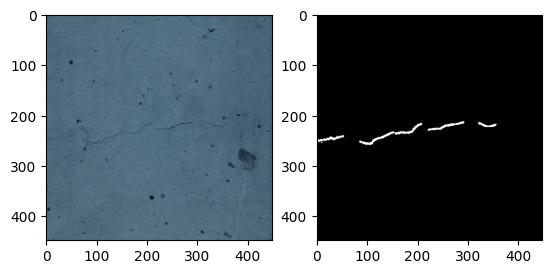

In [57]:
x=np.random.randint(0, len(df_valid))
print("Index: ",x)
plt.subplot(121)
plt.imshow(valid_dataset[x][0].cpu().detach().numpy().transpose(1,2,0))
plt.subplot(122)
plt.imshow(valid_dataset[x][1].cpu().detach().numpy().transpose(1,2,0), cmap='gray')

**Data Loaders **

In [58]:
train_dataloader=DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
valid_dataloader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, drop_last=True)

In [59]:
for i in train_dataloader:
    print((i[0][0]>1).sum())
    print(((i[1]>0)&(i[1]<1.0)).sum())
    print(i[0].shape)
    print(i[1].shape)
    break

tensor(0)
tensor(0)
torch.Size([5, 3, 448, 448])
torch.Size([5, 1, 448, 448])


In [60]:
for i in valid_dataloader:
    print((i[0][0]>1).sum())
    print(((i[1]>0)&(i[1]<1.0)).sum())
    print(i[0].shape)
    print(i[1].shape)
    break

tensor(0)
tensor(0)
torch.Size([5, 3, 448, 448])
torch.Size([5, 1, 448, 448])


## model building

### Unet vgg16

In [61]:
from torchvision import models
def double_conv(in_channels, out_channels):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True)
    )


def up_conv(in_channels, out_channels):
    return nn.ConvTranspose2d(
        in_channels, out_channels, kernel_size=2, stride=2
    )


class VGGUnet(nn.Module):
    """Unet with VGG-13 (with BN), VGG-16 (with BN) encoder.
    """

    def __init__(self,pretrained=False, out_channels=1):
        super().__init__()

        self.encoder = torchvision.models.vgg16_bn(pretrained=pretrained).features
        self.block1 = nn.Sequential(*self.encoder[:6])
        self.block2 = nn.Sequential(*self.encoder[6:13])
        self.block3 = nn.Sequential(*self.encoder[13:20])
        self.block4 = nn.Sequential(*self.encoder[20:27])
        self.block5 = nn.Sequential(*self.encoder[27:34])

        self.bottleneck = nn.Sequential(*self.encoder[34:])
        self.conv_bottleneck = double_conv(512, 1024)

        self.up_conv6 = up_conv(1024, 512)
        self.conv6 = double_conv(512 + 512, 512)
        self.up_conv7 = up_conv(512, 256)
        self.conv7 = double_conv(256 + 512, 256)
        self.up_conv8 = up_conv(256, 128)
        self.conv8 = double_conv(128 + 256, 128)
        self.up_conv9 = up_conv(128, 64)
        self.conv9 = double_conv(64 + 128, 64)
        self.up_conv10 = up_conv(64, 32)
        self.conv10 = double_conv(32 + 64, 32)
        self.conv11 = nn.Conv2d(32, out_channels, kernel_size=1)

    def forward(self, x):
        block1 = self.block1(x)
        block2 = self.block2(block1)
        block3 = self.block3(block2)
        block4 = self.block4(block3)
        block5 = self.block5(block4)

        bottleneck = self.bottleneck(block5)
        x = self.conv_bottleneck(bottleneck)

        x = self.up_conv6(x)
        x = torch.cat([x, block5], dim=1)
        x = self.conv6(x)

        x = self.up_conv7(x)
        x = torch.cat([x, block4], dim=1)
        x = self.conv7(x)

        x = self.up_conv8(x)
        x = torch.cat([x, block3], dim=1)
        x = self.conv8(x)

        x = self.up_conv9(x)
        x = torch.cat([x, block2], dim=1)
        x = self.conv9(x)

        x = self.up_conv10(x)
        x = torch.cat([x, block1], dim=1)
        x = self.conv10(x)

        x = self.conv11(x)

        return x

In [62]:
# enc1=torchvision.models.vgg16_bn().features()
# enc1

In [64]:
# enc1

In [65]:
model=VGGUnet(pretrained=True)
model=model.to(device)

Downloading: "https://download.pytorch.org/models/vgg16_bn-6c64b313.pth" to /root/.cache/torch/hub/checkpoints/vgg16_bn-6c64b313.pth
100%|██████████| 528M/528M [00:02<00:00, 258MB/s]  


In [66]:
model

VGGUnet(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 

In [67]:
# outputs=None
# model=model.to(device)
# for i in train_dataloader:
#     model.eval()
#     inputs,masks=i
#     inputs=inputs.to(device)
#     masks=masks.to(device)
#     outputs=model(inputs)
# #     metrics=find_metrics(outputs,masks)
    
#     break
# print(outputs.shape)

In [68]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = YourModel().to(device)  # Replace YourModel with your actual model
# input_tensor = torch.randn(batch_size, 3, 448, 448).to(device)
# 

In [69]:
# out_tensor = torch.randint(0, 2, (batch_size, 1, 448, 448), device=device)


In [70]:
# input_tensor.shape

In [71]:
# max_memory_allocated = torch.cuda.max_memory_allocated(device)
# current_memory_allocated = torch.cuda.memory_allocated(device)

# print(f"Maximum GPU memory allocated: {max_memory_allocated / (1024 * 1024):.2f} MB")
# print(f"Current GPU memory allocated: {current_memory_allocated / (1024 * 1024):.2f} MB")


In [72]:
# Ensure that all caches are empty (not necessary but can provide a more accurate measurement)
# torch.cuda.empty_cache()

# # Perform a forward pass to allocate memory
# output_tensor = model(input_tensor)


# # Measure GPU memory usage
# max_memory_allocated = torch.cuda.max_memory_allocated(device)
# current_memory_allocated = torch.cuda.memory_allocated(device)

# print(f"Maximum GPU memory allocated: {max_memory_allocated / (1024 * 1024):.2f} MB")
# print(f"Current GPU memory allocated: {current_memory_allocated / (1024 * 1024):.2f} MB")


In [73]:
# optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)  # if unfreeze=True -> 1e-4, 1e-5, so not to ruin good init w
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, min_lr=1e-6, factor=0.1)
# # early = EarlyStopping()


# # Loss function and optimizer
# criterion = nn.BCEWithLogitsLoss()
# loss = criterion(output_tensor, output_tensor)
# loss.backward()
# optimizer.step()

### Deep Lab v3

In [74]:
# from torchvision.models.segmentation.deeplabv3 import DeepLabHead

# def get_model(output_channels=1, unfreeze=True):
#     model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True, progress=False)
    
#     for param in model.parameters():
#         param.requires_grad = unfreeze
    
#     model.classifier = DeepLabHead(2048, output_channels)
    
#     return model.to(device)

# model = UNET(3,1)  # set output_channels = 3 if we work with colored masks

In [75]:
# model=get_model(1,True)

In [76]:
# model

In [77]:
# model=model.to(device)

In [78]:
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0, path=path):
        self.path = path
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = np.inf
        self.early_stop = False
        
    def __call__(self, val_loss, model=None):
        if self.best_loss - val_loss > self.min_delta:
            torch.save(model.state_dict(), self.path)
            print(f'Model saved to: {self.path}')
            self.best_loss = val_loss
            self.counter = 0
        elif self.best_loss - val_loss < self.min_delta:
            self.counter += 1
            print(f"INFO: Early stopping counter {self.counter} of {self.patience}")
            if self.counter >= self.patience:
                print('INFO: Early stopping')
                self.early_stop = True

In [79]:
# test_transforms=T.Compose([
#     T.ToPILImage(),
#       # Apply augmentation transforms with a 50% probability
#     T.Resize((image_size,image_size)),
#     T.ToTensor(),
# ])

In [80]:
test_transforms=train_transforms

In [81]:
test_transforms

Compose(
    ToPILImage()
    Resize(size=(448, 448), interpolation=bilinear, max_size=None, antialias=warn)
    ToTensor()
)

In [82]:
# outputs=None
# model=model.to(device)
# for i in train_dataloader:
#     model.eval()
#     inputs,masks=i
#     inputs=inputs.to(device)
#     masks=masks.to(device)
#     outputs=model(inputs)
# #     metrics=find_metrics(outputs,masks)
    
#     break

In [83]:
# outputs

In [84]:
# model.name

In [85]:
# outputs['out'][0].dtype

In [86]:
@torch.no_grad()
def validate_test_image(model, dataset,n=None):
    if n:
        idx=n
    else:
        idx = np.random.randint(len(dataset))

    dataset = dataset.reset_index(drop=True)
    row = dataset.loc[idx].squeeze()
    
    image = cv2.imread(row['images'])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_tensor = test_transforms(image).unsqueeze(0).to(device)
    
    mask = cv2.imread(row['masks'])
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
    mask = cv2.resize(mask, (image_size, image_size))
    _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
    
#     print((mask==255).sum())

    mask=np.expand_dims(mask, axis=-1)

    
    
    
    print("shape of image",image_tensor.shape,"mask.shape",mask.shape)
#     model.eval()
    output = model(image_tensor)
    
#     print(output.shape)
    output=output.squeeze(0)
    
#     print(output.shape)
#     print(output)
    output=torch.sigmoid(output)

    output=output.detach().cpu()
#     print(output)
    output=(output > threshold).float()
    
    
#     print(((output>0.0) & (output<1.0)).sum())
    output=output.numpy().transpose(1,2,0)
    

  
    
    plt.figure(figsize=(8, 4))
    plt.subplot(131)
    plt.title('Original image')
    plt.imshow(image)
    
    plt.subplot(132)
    plt.title('Original mask')
    plt.imshow(mask, cmap='gray')
    
    plt.subplot(133)
    plt.title('Predicted mask')
    plt.imshow(output,cmap="gray")
    
#     print(output)
    
    plt.tight_layout()
    plt.show()
    plt.pause(0.001)

shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


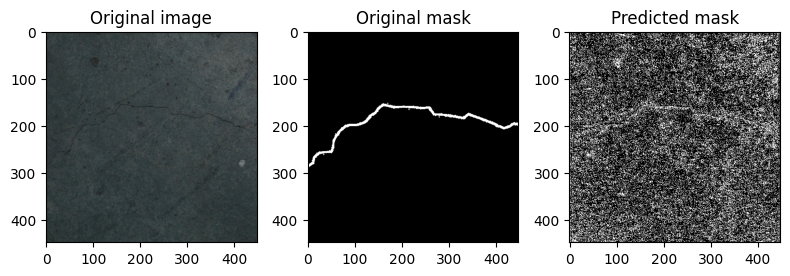

In [87]:
validate_test_image(model, df_valid)

In [88]:
# def train_one_batch(batch, model, criterion, optimizer):
#     images, masks = batch
#     optimizer.zero_grad()
#     plt.imshow(image)
    
#     plt.subplot(132)
#     plt.title('Original mask')
#     plt.imshow(mask, cmap='gray')
    
#     plt.subplot(133)
#     plt.title('Predicted mask')
#     plt.imshow(output, cmap='gray')
# #     print(output)
    
#     plt.tight_layout()
#     plt.show()
#     output = model(images)
#     loss = criterion(output, masks,reduction='mean',alpha=0.7,gamma=1.5)
#     loss.backward()
#     optimizer.step()
#     dice_loss=None
#     with torch.no_grad():
#         dice_loss=dice_coefficient(output,masks)
#     return loss.item(),dice_loss
# @torch.no_grad()

# def validate_one_batch(batch, model, criterion):
#     images, masks = batch
#     output = model(images)
#     dice_loss=None
#     with torch.no_grad():
#         dice_loss=dice_coefficient(output,masks)
#     loss =criterion(output, masks,reduction='mean',alpha=0.25,gamma=1.5)
# #     loss=criterion(output,masks)
#     return loss.item(),dice_loss

In [89]:
# def dice(y_true, y_pred):
#     return (2 * (y_true * y_pred).sum() + 1e-15) / (y_true.sum() + y_pred.sum() + 1e-15)

# def iou(y_true, y_pred):
#     intersection = (y_true * y_pred).sum()
#     union = y_true.sum() + y_pred.sum() - intersection
#     return (intersection + 1e-15) / (union + 1e-15)

# def precision(y_true, y_pred):
#     TP = (y_true * y_pred).sum()
#     FP = ((1-y_true)*y_pred).sum()
#     return (TP + 1e-15) / (TP + FP + 1e-15)

# def recall(y_true, y_pred):
#     TP = (y_true * y_pred).sum()
#     FN = (y_true*(1 - y_pred)).sum()
#     return (TP + 1e-15) / (TP + FN + 1e-15)

In [90]:
def precision_tensor(y_true, y_pred):
    # Calculate True Positives (TP)
    TP = torch.sum(y_true * y_pred)

    # Calculate False Positives (FP)
    FP = torch.sum((1 - y_true) * y_pred)

    # Compute precision
    epsilon = 1e-15  # Small value to avoid division by zero
    precision_value = (TP ) / (TP + FP + epsilon)

    return precision_value

In [91]:
def recall_tensor(y_true, y_pred):
    # Calculate True Positives (TP)
    TP = torch.sum(y_true * y_pred)

    # Calculate False Negatives (FN)
    FN = torch.sum(y_true * (1 - y_pred))

    # Compute recall
    epsilon = 1e-15  # Small value to avoid division by zero
    recall_value = (TP ) / (TP + FN + epsilon)

    return recall_value

In [92]:
test=train_dataset[2]
test[0].shape
    

torch.Size([3, 448, 448])

In [93]:
# train_img=test[0].unsqueeze(0)

In [94]:
inp=test[0].unsqueeze(0)
inp.shape

torch.Size([1, 3, 448, 448])

In [95]:
# with torch.no_grad():
#     output=model(inp)

In [96]:
# import torch.nn.functional as F
# out_sig=F.sigmoid(output)

In [97]:
# output

In [98]:
# output.shape

In [99]:
# output=output.numpy().transpose(1,2,0)

In [100]:
# output

In [101]:
# threshold_value = 0.6
# max_value = 1
# _, out_tr = cv2.threshold(output, threshold_value, max_value, cv2.THRESH_BINARY)

In [102]:
# y_pred=np.expand_dims(y_pred,axis=-1)

In [103]:
# output=output[0].cpu().detach().numpy().transpose(1,2,0)

In [104]:
# t_mask=t_mask[0].cpu().detach().numpy().transpose(1,2,0)

## Training 

In [105]:
def find_metrics(outputs, masks, threshold=threshold):
    dice_scores = []
    iou_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    outputs = torch.sigmoid(outputs)
    for i in range(batch_size):
        with torch.no_grad():
            y_pred = (outputs[i] > threshold).float()
            intersection = torch.logical_and(y_pred, masks[i])
            union = torch.logical_or(y_pred, masks[i])

            iou1 = (torch.sum(intersection) + 1e-15) / (torch.sum(union) + 1e-15)
            dice1 = (2 * torch.sum(intersection) + 1e-15) / (torch.sum(y_pred) + torch.sum(masks[i]) + 1e-15)
            
            precision1 = precision_tensor(y_pred, masks[i])
            recall1 = recall_tensor(y_pred, masks[i])
            f11 = (2 * precision1 * recall1) / (precision1 + recall1+1e-15)

            dice_scores.append(dice1)
            iou_scores.append(iou1)
            precision_scores.append(precision1)
            recall_scores.append(recall1)
            f1_scores.append(f11)

    return {
        'dice': torch.mean(torch.tensor(dice_scores, device='cpu')),
        'iou': torch.mean(torch.tensor(iou_scores, device='cpu')),
        'precision': torch.mean(torch.tensor(precision_scores, device='cpu')),
        'recall': torch.mean(torch.tensor(recall_scores, device='cpu')),
        'f1_score': torch.mean(torch.tensor(f1_scores, device='cpu'))
    }


In [106]:
# torch.cuda.empty_cache()

In [107]:
model

VGGUnet(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 

Epoch 1/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.430510348379612
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


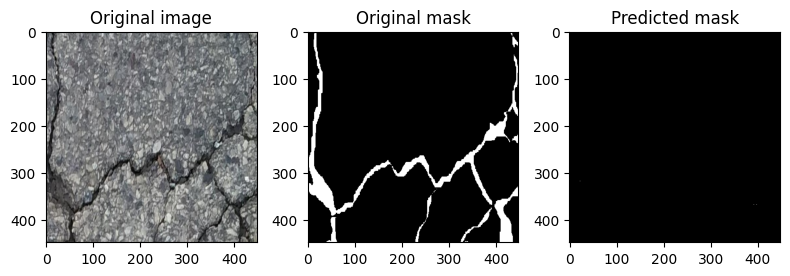

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


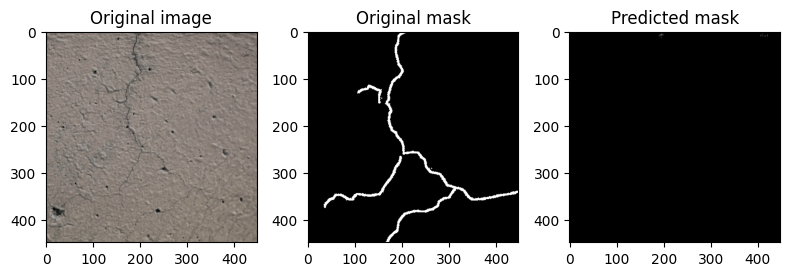

train_data visualize: loss:  0.24492585361003877
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


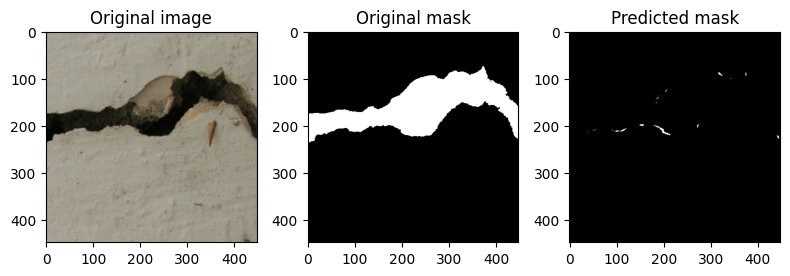

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


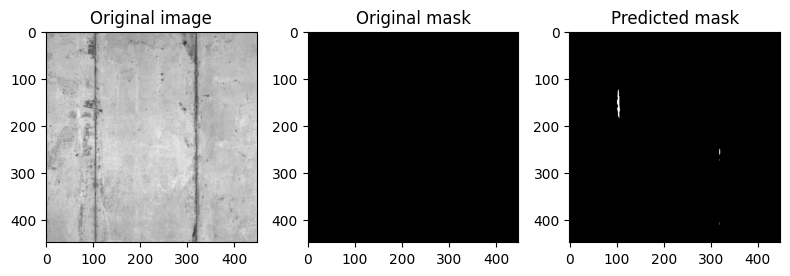

{'loss': [0.30735097105910136], 'dice': [0.26133714140391895], 'iou': [0.2367171083736368], 'precision': [0.07759041904503876], 'recall': [0.17010128725300225], 'f1_score': [0.08979242475180672]}
training_loss: 0.30711
training_iou: 0.23672
training_dice: 0.26134
{'loss': [0.15636860197456323], 'dice': [0.6721399084697315], 'iou': [0.5587103096443918], 'precision': [0.43998471599313155], 'recall': [0.5852494064848222], 'f1_score': [0.4830851786172212]}
Validation loss: 0.1564
Validation iou: 0.5587
Validation dice: 0.6721
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


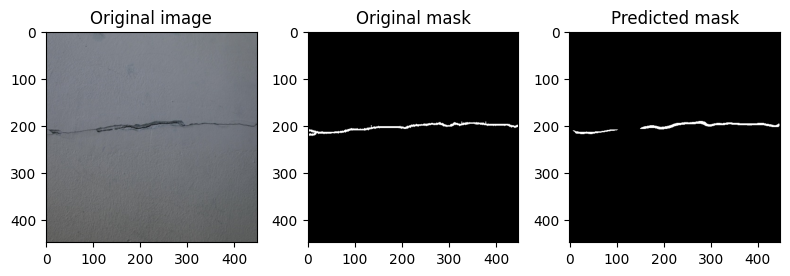

Epoch 2/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.13055893023312093
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


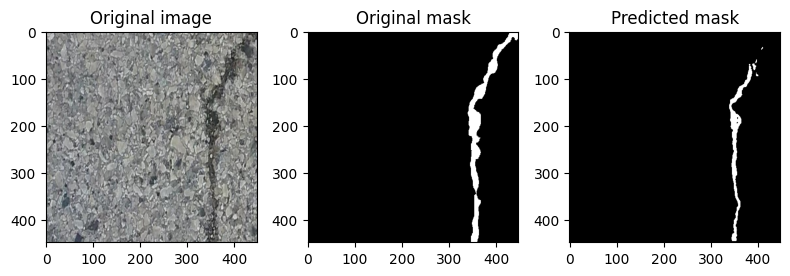

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


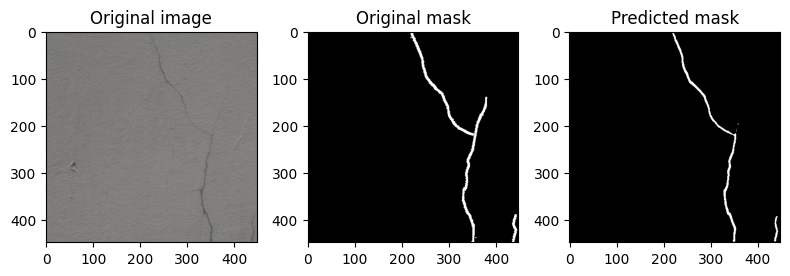

train_data visualize: loss:  0.09103264576196671
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


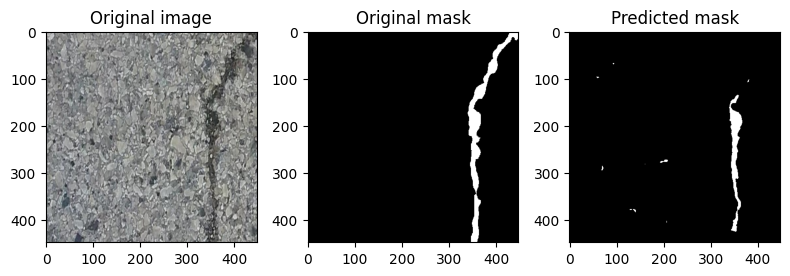

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


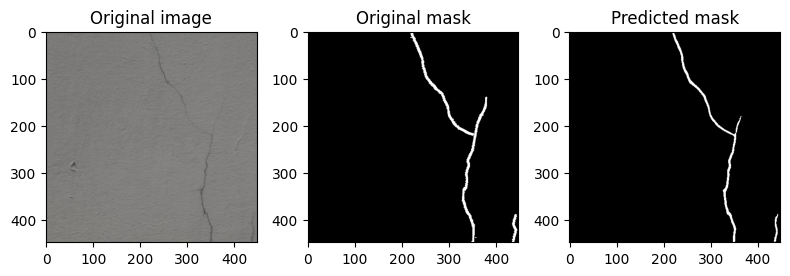

{'loss': [0.30735097105910136, 0.10334037492975473], 'dice': [0.26133714140391895, 0.6268709508505294], 'iou': [0.2367171083736368, 0.512404073241765], 'precision': [0.07759041904503876, 0.43740106492144304], 'recall': [0.17010128725300225, 0.5911559167855639], 'f1_score': [0.08979242475180672, 0.47809046467508726]}
training_loss: 0.10329
training_iou: 0.51240
training_dice: 0.62687
{'loss': [0.15636860197456323, 0.06303978652058549], 'dice': [0.6721399084697315, 0.6903245740590979], 'iou': [0.5587103096443918, 0.5802612996394328], 'precision': [0.43998471599313155, 0.42133858056150525], 'recall': [0.5852494064848222, 0.6126469827780676], 'f1_score': [0.4830851786172212, 0.4813693471383813]}
Validation loss: 0.0630
Validation iou: 0.5803
Validation dice: 0.6903
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


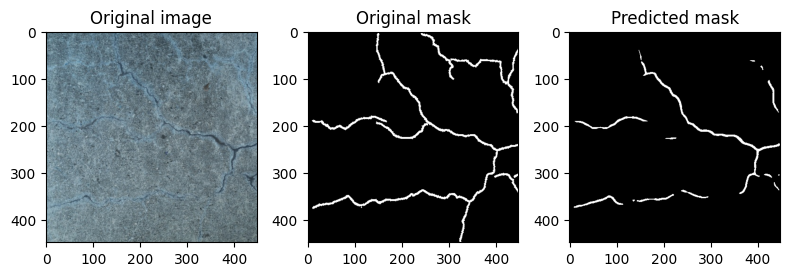

Epoch 3/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.058588583283126355
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


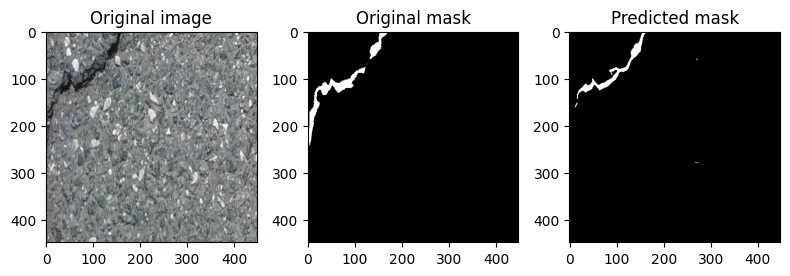

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


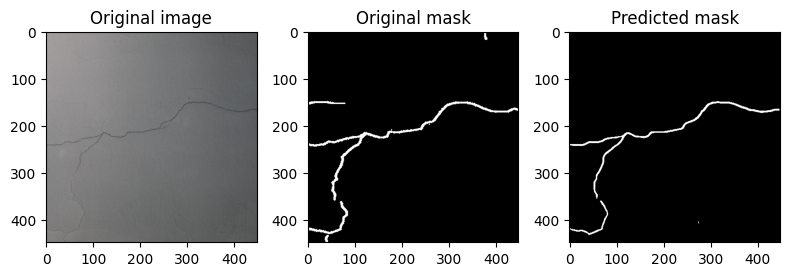

train_data visualize: loss:  0.046286821991205214
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


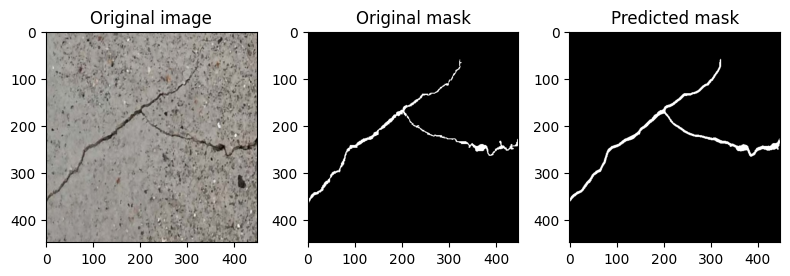

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


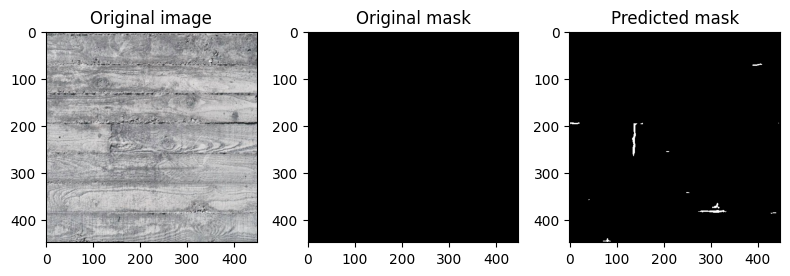

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643], 'precision': [0.07759041904503876, 0.43740106492144304, 0.4566697420749238], 'recall': [0.17010128725300225, 0.5911559167855639, 0.6212300045218894], 'f1_score': [0.08979242475180672, 0.47809046467508726, 0.5072716682907042]}
training_loss: 0.05001
training_iou: 0.55020
training_dice: 0.66662
{'loss': [0.15636860197456323, 0.06303978652058549, 0.03655342522322835], 'dice': [0.6721399084697315, 0.6903245740590979, 0.6994261386559868], 'iou': [0.5587103096443918, 0.5802612996394328, 0.5891932169912587], 'precision': [0.43998471599313155, 0.42133858056150525, 0.48139343188788314], 'recall': [0.5852494064848222, 0.6126469827780676, 0.6021189918343107], 'f1_score': [0.4830851786172212, 0.4813693471383813, 0.5203216558545875]}
Validation loss: 0.0366
Validation iou: 0.5892
Validatio

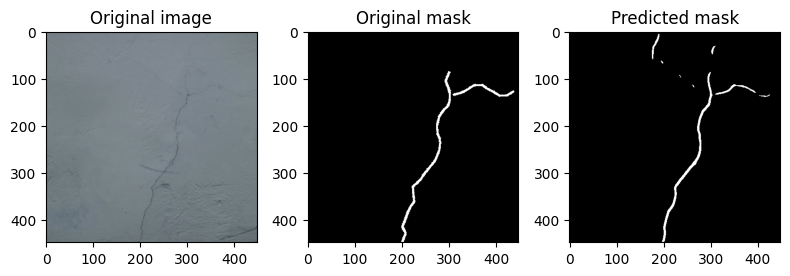

Model saved after 3 epochs to seg_model_3.pth
Epoch 4/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.03442525734379888
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


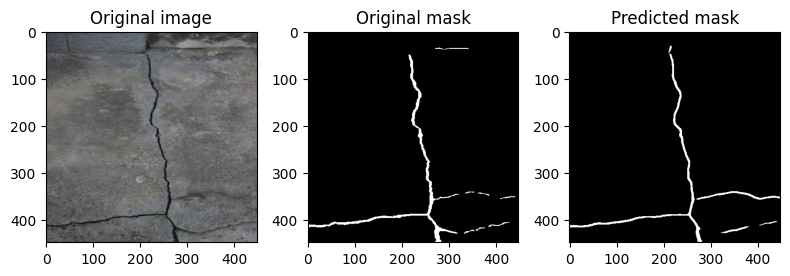

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


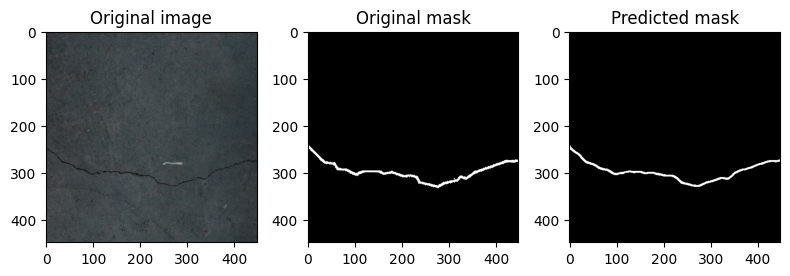

train_data visualize: loss:  0.03083925235643983
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


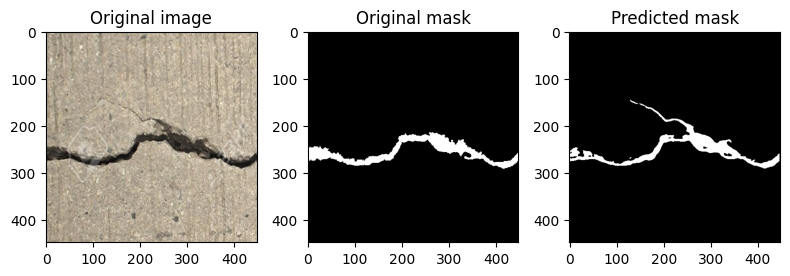

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


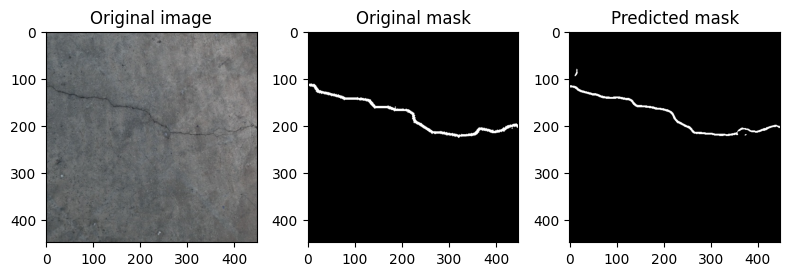

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329], 'precision': [0.07759041904503876, 0.43740106492144304, 0.4566697420749238, 0.4747761586696152], 'recall': [0.17010128725300225, 0.5911559167855639, 0.6212300045218894, 0.6292990986409226], 'f1_score': [0.08979242475180672, 0.47809046467508726, 0.5072716682907042, 0.5247588721596128]}
training_loss: 0.03172
training_iou: 0.57961
training_dice: 0.69549
{'loss': [0.15636860197456323, 0.06303978652058549, 0.03655342522322835, 0.026306449412484074], 'dice': [0.6721399084697315, 0.6903245740590979, 0.6994261386559868, 0.7417420549958189], 'iou': [0.5587103096443918, 0.5802612996394328, 0.5891932169912587, 0.6328268991353944], 'precision': [0.43998471599313155, 0.42133858056150525, 0.48139343188788314, 0.5177518789854395],

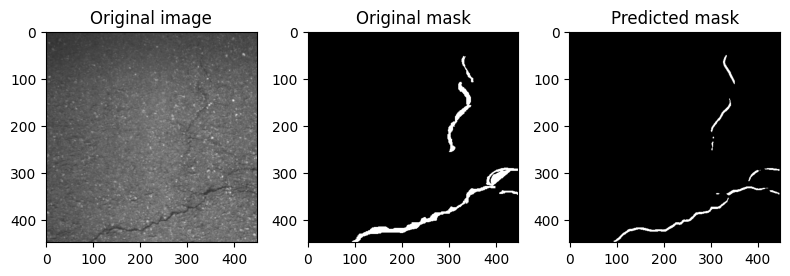

Epoch 5/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.025052983608096838
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


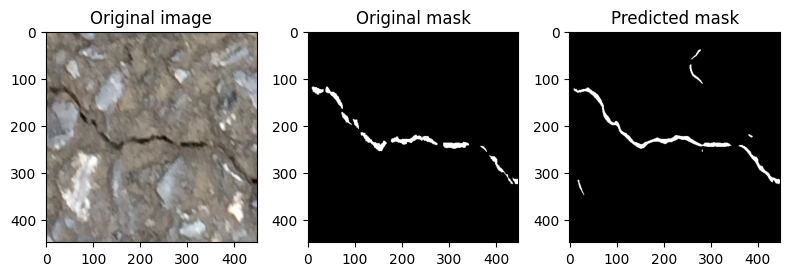

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


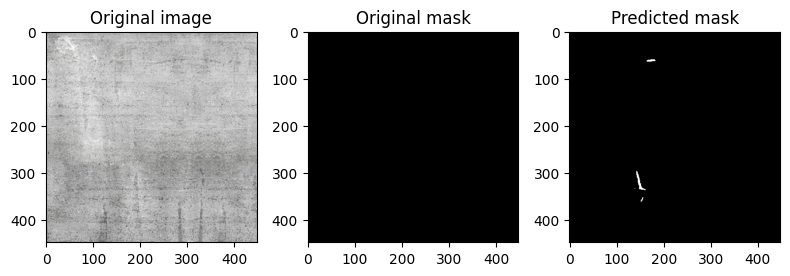

train_data visualize: loss:  0.02317951823398471
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


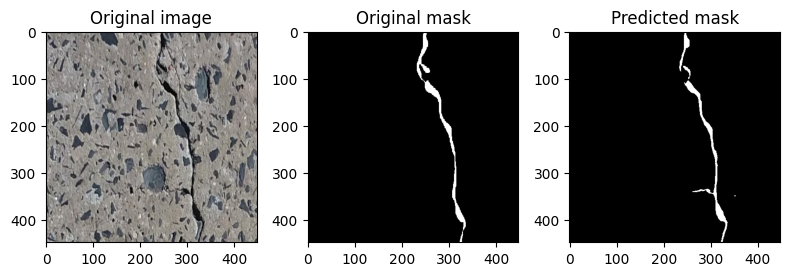

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


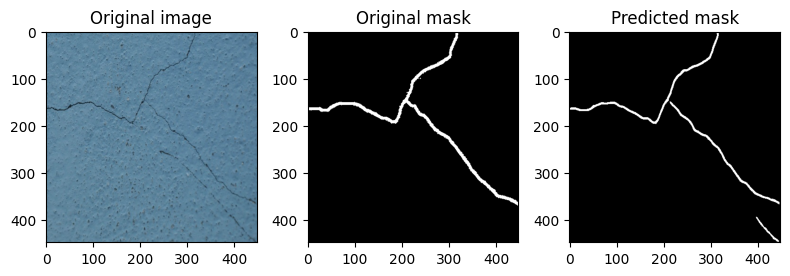

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138], 'precision': [0.07759041904503876, 0.43740106492144304, 0.4566697420749238, 0.4747761586696152, 0.503796447704478], 'recall': [0.17010128725300225, 0.5911559167855639, 0.6212300045218894, 0.6292990986409226, 0.6576483203628198], 'f1_score': [0.08979242475180672, 0.47809046467508726, 0.5072716682907042, 0.5247588721596128, 0.5559899742768063]}
training_loss: 0.02383
training_iou: 0.60062
training_dice: 0.71697
{'loss': [0.15636860197456323, 0.06303978652058549, 0.03655342522322835, 0.026306449412484074, 0.022244201984664248], 'dice': [0.6721399084697315, 0.6903245740590979, 0.6994261386559868, 0.7417420549958189, 0.6954070676780718], 'iou': [0.5587103096443

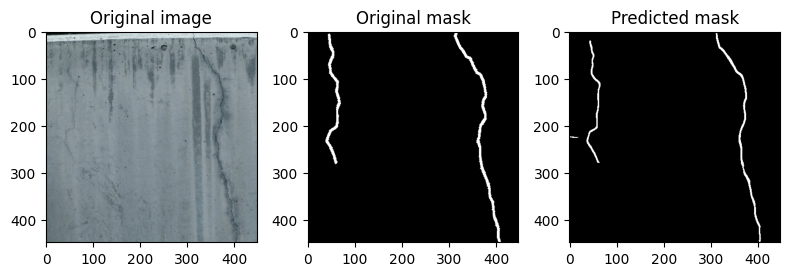

Epoch 6/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.02026215340476483
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


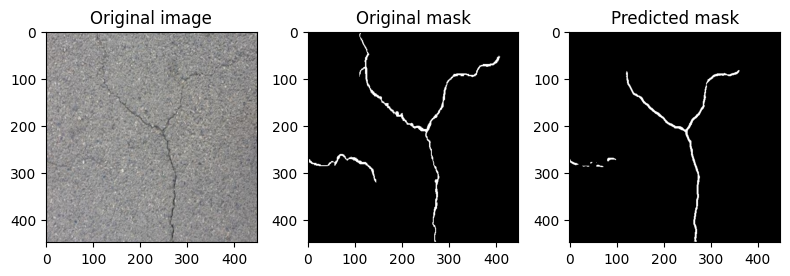

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


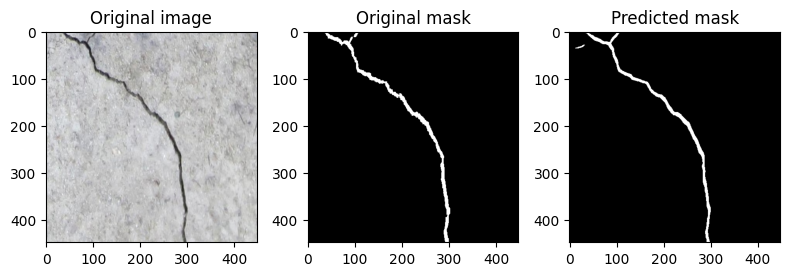

train_data visualize: loss:  0.01914350908435881
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


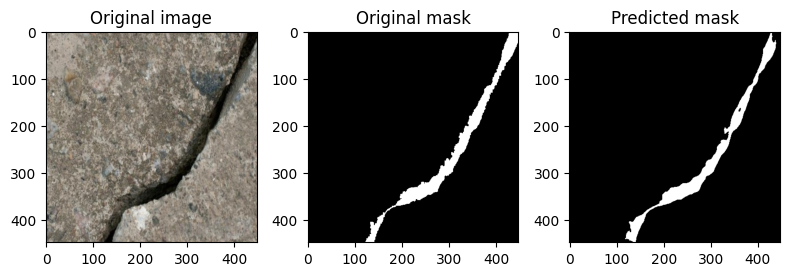

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


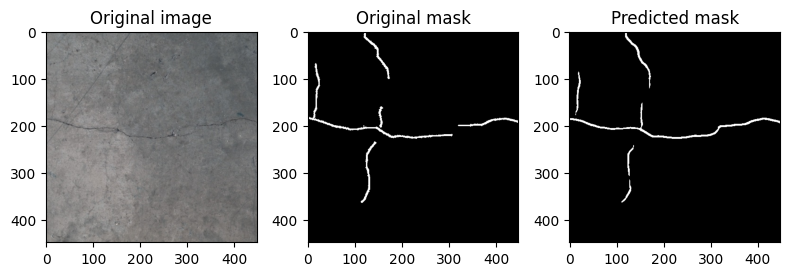

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564, 0.019499265335924255], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219, 0.7358275226703505], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138, 0.6250082099340796], 'precision': [0.07759041904503876, 0.43740106492144304, 0.4566697420749238, 0.4747761586696152, 0.503796447704478, 0.5158978577370081], 'recall': [0.17010128725300225, 0.5911559167855639, 0.6212300045218894, 0.6292990986409226, 0.6576483203628198, 0.6472675786088637], 'f1_score': [0.08979242475180672, 0.47809046467508726, 0.5072716682907042, 0.5247588721596128, 0.5559899742768063, 0.5618437825724846]}
training_loss: 0.01949
training_iou: 0.62501
training_dice: 0.73583
{'loss': [0.15636860197456323, 0.06303978652058549, 0.03655342522322835, 0.026306449412484074, 0.022244201984664248, 0.0191572788

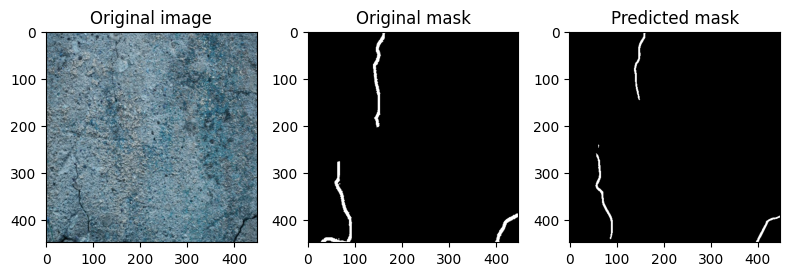

Epoch 7/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.01754067693091929
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


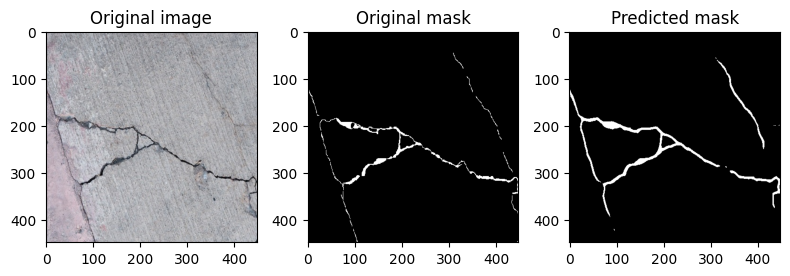

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


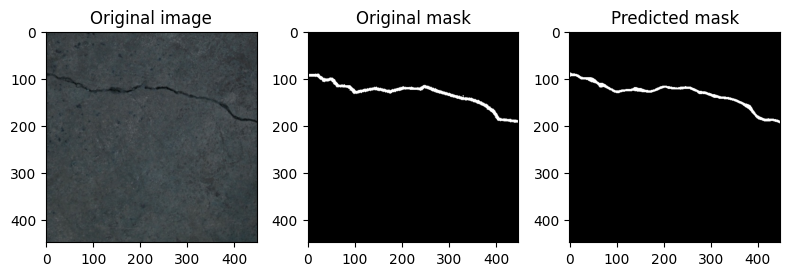

train_data visualize: loss:  0.016539360038004814
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


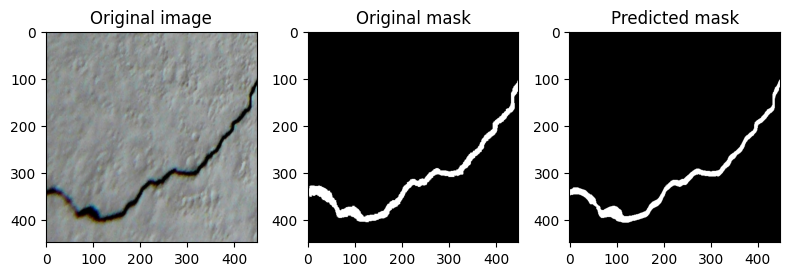

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


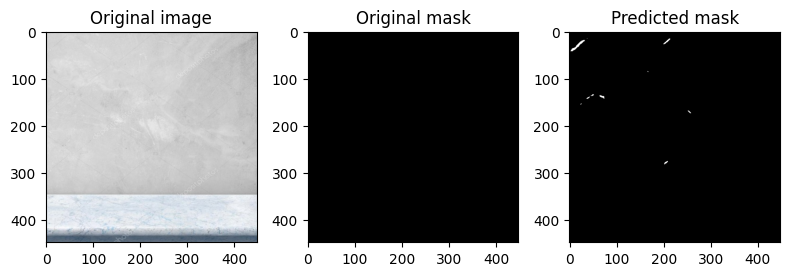

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564, 0.019499265335924255, 0.01709651308005479], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219, 0.7358275226703505, 0.7535842105867417], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138, 0.6250082099340796, 0.6429527971318098], 'precision': [0.07759041904503876, 0.43740106492144304, 0.4566697420749238, 0.4747761586696152, 0.503796447704478, 0.5158978577370081, 0.5493883933962845], 'recall': [0.17010128725300225, 0.5911559167855639, 0.6212300045218894, 0.6292990986409226, 0.6576483203628198, 0.6472675786088637, 0.6814371784770392], 'f1_score': [0.08979242475180672, 0.47809046467508726, 0.5072716682907042, 0.5247588721596128, 0.5559899742768063, 0.5618437825724846, 0.5966736371439647]}
training_loss: 0.01709
training_iou: 0.64295
training_dice: 0.75358
{'loss':

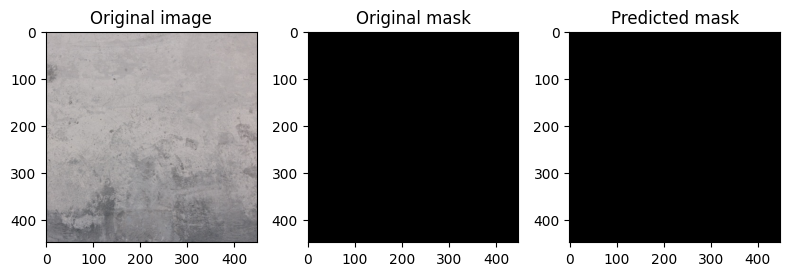

Epoch 8/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.015116901313886046
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


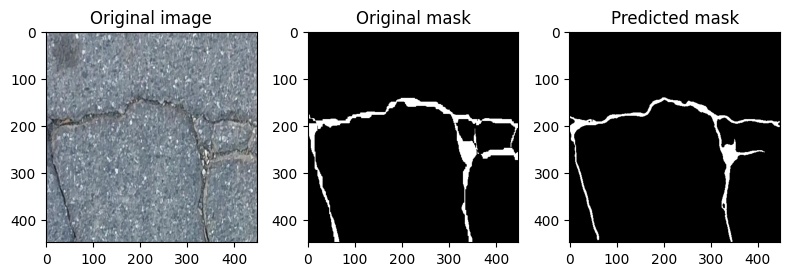

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


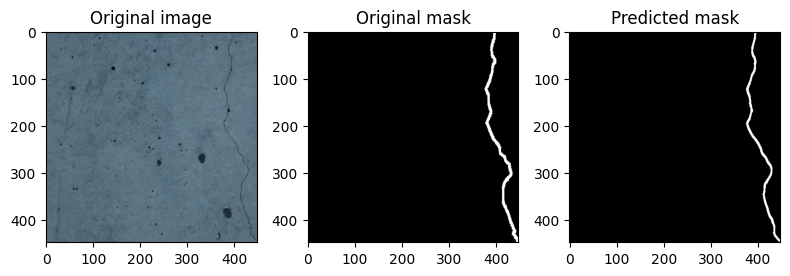

train_data visualize: loss:  0.015381685957778245
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


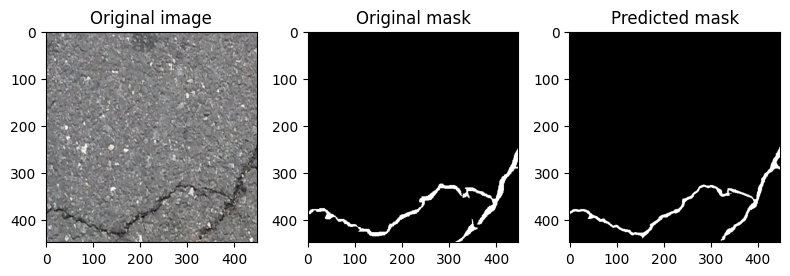

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


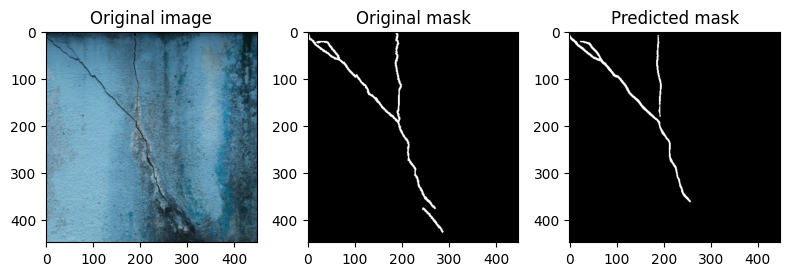

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564, 0.019499265335924255, 0.01709651308005479, 0.01512895575535249], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219, 0.7358275226703505, 0.7535842105867417, 0.7696522017562293], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138, 0.6250082099340796, 0.6429527971318098, 0.6651473568706978], 'precision': [0.07759041904503876, 0.43740106492144304, 0.4566697420749238, 0.4747761586696152, 0.503796447704478, 0.5158978577370081, 0.5493883933962845, 0.546744680198712], 'recall': [0.17010128725300225, 0.5911559167855639, 0.6212300045218894, 0.6292990986409226, 0.6576483203628198, 0.6472675786088637, 0.6814371784770392, 0.6607055548366493], 'f1_score': [0.08979242475180672, 0.47809046467508726, 0.5072716682907042, 0.5247588721596128, 0.5559899742768063, 0.561843782572484

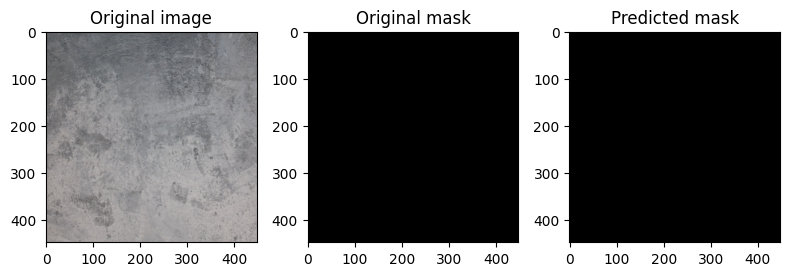

Epoch 9/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.013910663913469762
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


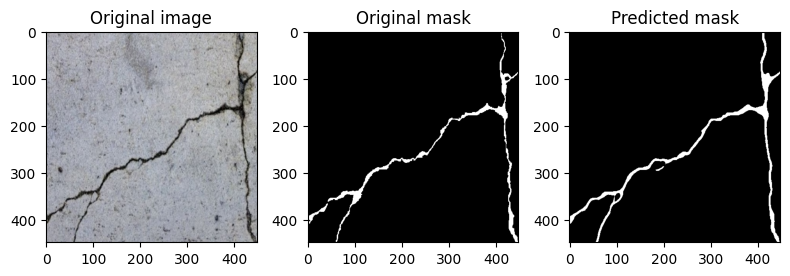

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


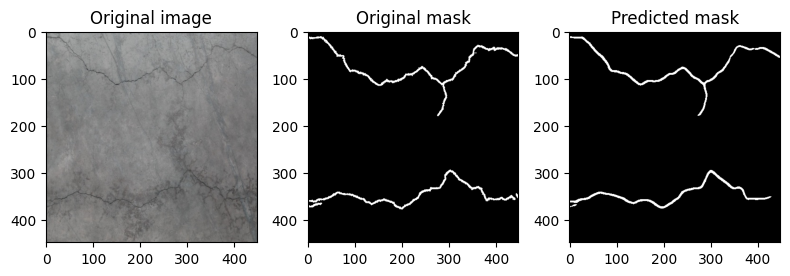

train_data visualize: loss:  0.013324851010460407
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


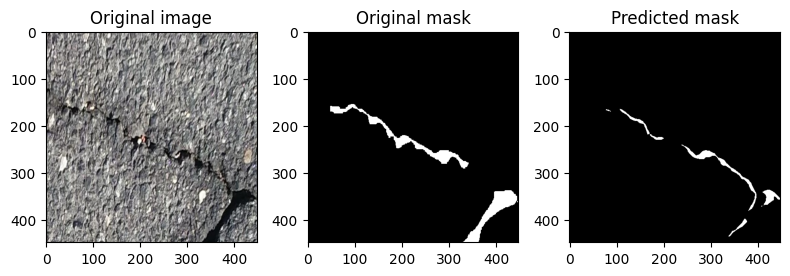

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


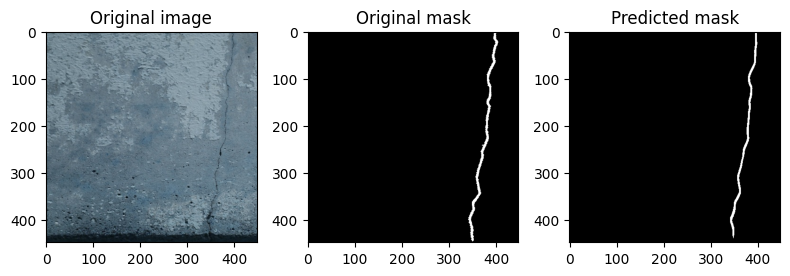

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564, 0.019499265335924255, 0.01709651308005479, 0.01512895575535249, 0.013621432373557634], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219, 0.7358275226703505, 0.7535842105867417, 0.7696522017562293, 0.7931600233645943], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138, 0.6250082099340796, 0.6429527971318098, 0.6651473568706978, 0.6915467737651453], 'precision': [0.07759041904503876, 0.43740106492144304, 0.4566697420749238, 0.4747761586696152, 0.503796447704478, 0.5158978577370081, 0.5493883933962845, 0.546744680198712, 0.5845962218273946], 'recall': [0.17010128725300225, 0.5911559167855639, 0.6212300045218894, 0.6292990986409226, 0.6576483203628198, 0.6472675786088637, 0.6814371784770392, 0.6607055548366493, 0.689230724745165], 'f1_score': [0.0897924247518067

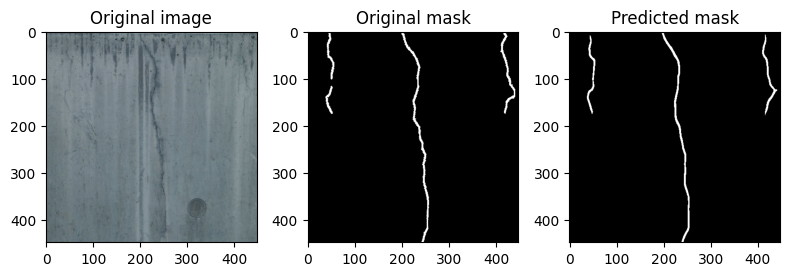

Epoch 10/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.012906585042830557
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


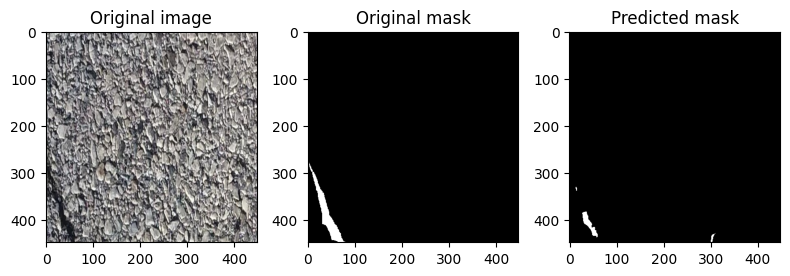

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


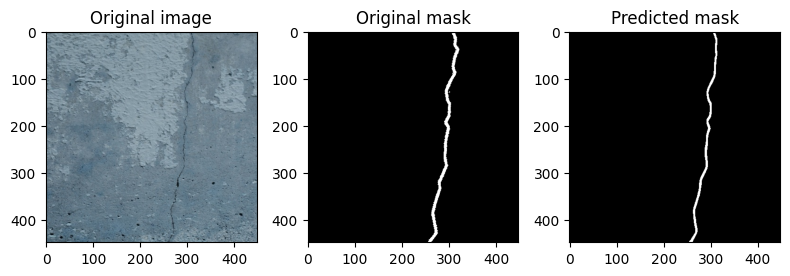

train_data visualize: loss:  0.012495473080780356
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


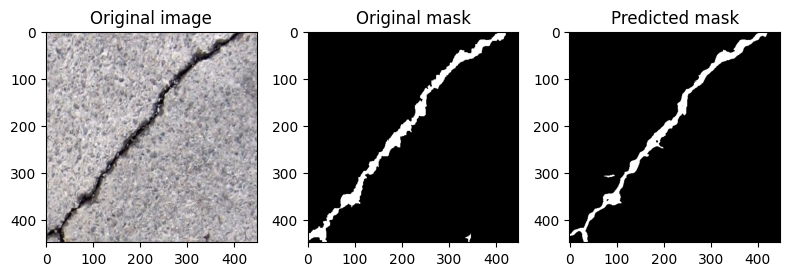

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


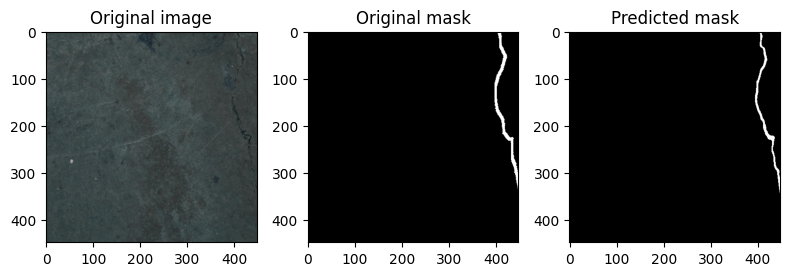

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564, 0.019499265335924255, 0.01709651308005479, 0.01512895575535249, 0.013621432373557634, 0.012963507075158014], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219, 0.7358275226703505, 0.7535842105867417, 0.7696522017562293, 0.7931600233645943, 0.7919522185878056], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138, 0.6250082099340796, 0.6429527971318098, 0.6651473568706978, 0.6915467737651453, 0.6936000367490257], 'precision': [0.07759041904503876, 0.43740106492144304, 0.4566697420749238, 0.4747761586696152, 0.503796447704478, 0.5158978577370081, 0.5493883933962845, 0.546744680198712, 0.5845962218273946, 0.5833427889681444], 'recall': [0.17010128725300225, 0.5911559167855639, 0.6212300045218894, 0.6292990986409226, 0.6576483203628198, 0.6472675786088637, 0.6814371

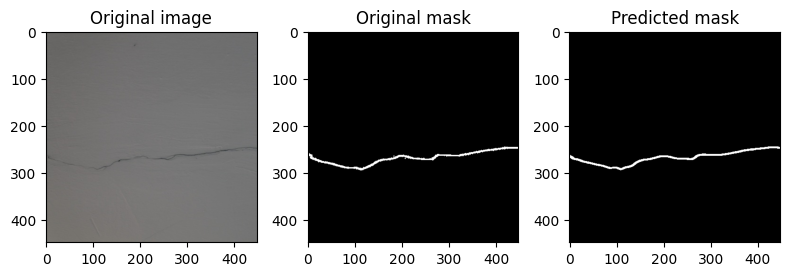

Epoch 11/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.012857748733833432
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


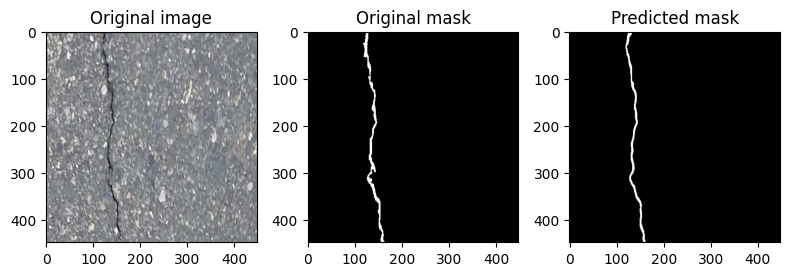

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


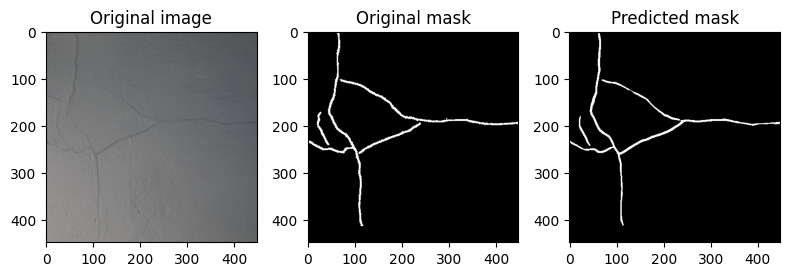

train_data visualize: loss:  0.01277157986164093
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


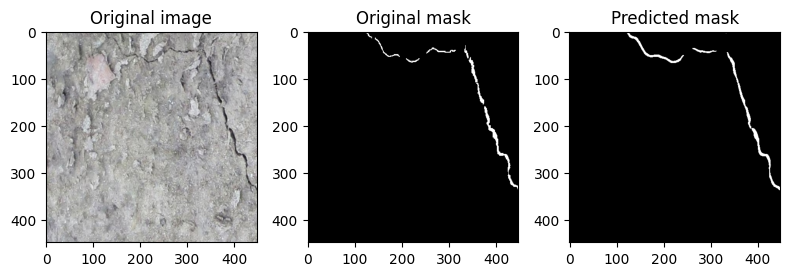

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


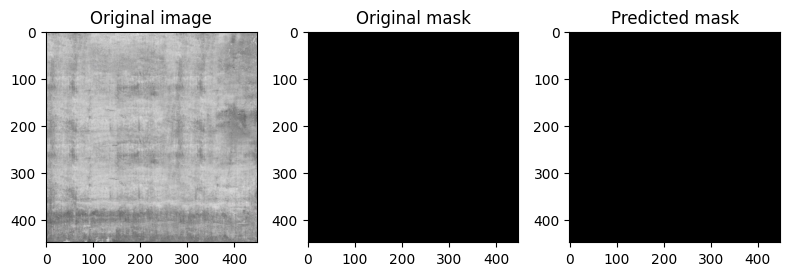

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564, 0.019499265335924255, 0.01709651308005479, 0.01512895575535249, 0.013621432373557634, 0.012963507075158014, 0.01257929287423054], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219, 0.7358275226703505, 0.7535842105867417, 0.7696522017562293, 0.7931600233645943, 0.7919522185878056, 0.8057941691419943], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138, 0.6250082099340796, 0.6429527971318098, 0.6651473568706978, 0.6915467737651453, 0.6936000367490257, 0.7089014441017213], 'precision': [0.07759041904503876, 0.43740106492144304, 0.4566697420749238, 0.4747761586696152, 0.503796447704478, 0.5158978577370081, 0.5493883933962845, 0.546744680198712, 0.5845962218273946, 0.5833427889681444, 0.5944650292517694], 'recall': [0.17010128725300225, 0.5911559167855639, 0.621230

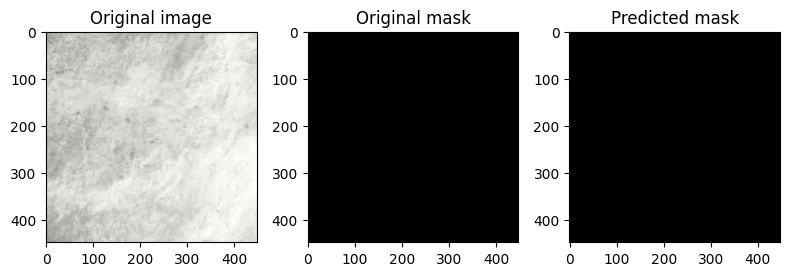

Epoch 12/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.011045234508579596
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


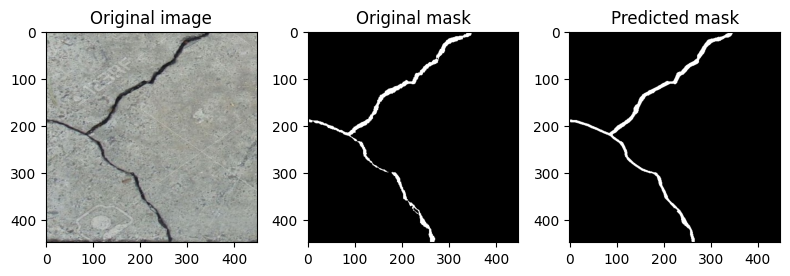

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


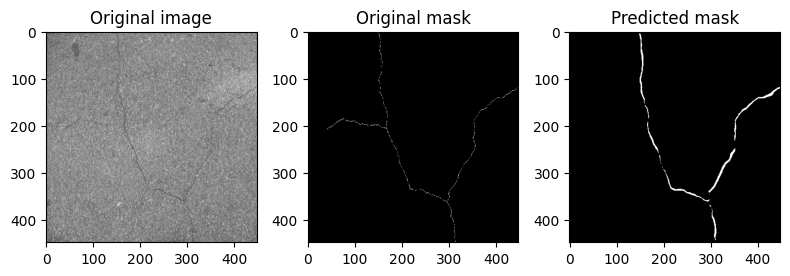

train_data visualize: loss:  0.011251104108290748
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


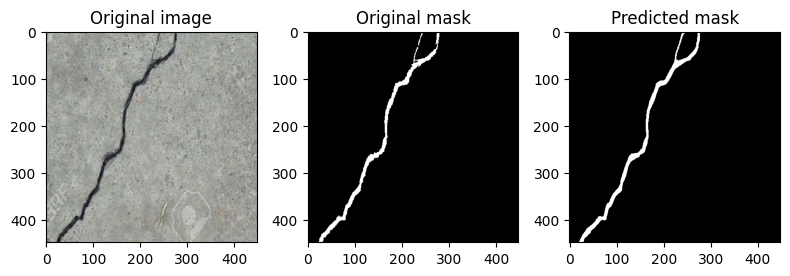

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


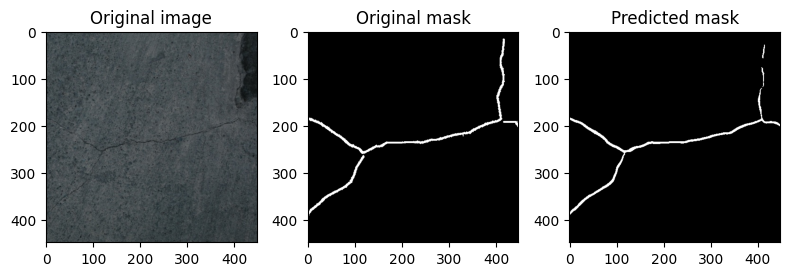

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564, 0.019499265335924255, 0.01709651308005479, 0.01512895575535249, 0.013621432373557634, 0.012963507075158014, 0.01257929287423054, 0.011458893921945578], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219, 0.7358275226703505, 0.7535842105867417, 0.7696522017562293, 0.7931600233645943, 0.7919522185878056, 0.8057941691419943, 0.8058949148327839], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138, 0.6250082099340796, 0.6429527971318098, 0.6651473568706978, 0.6915467737651453, 0.6936000367490257, 0.7089014441017213, 0.7116536901188575], 'precision': [0.07759041904503876, 0.43740106492144304, 0.4566697420749238, 0.4747761586696152, 0.503796447704478, 0.5158978577370081, 0.5493883933962845, 0.546744680198712, 0.5845962218273946, 0.5833427889681444, 0.5944650292517694,

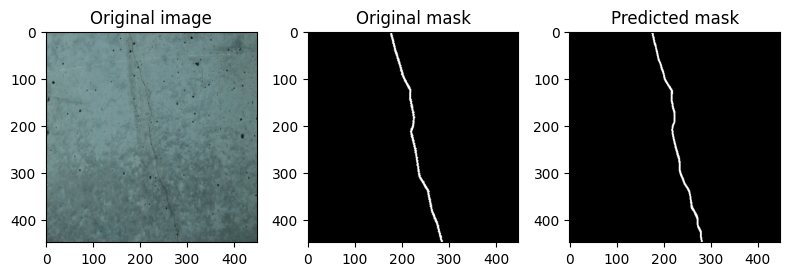

Epoch 13/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.01076760681765154
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


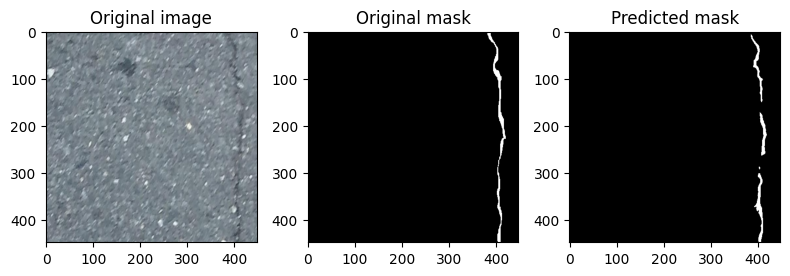

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


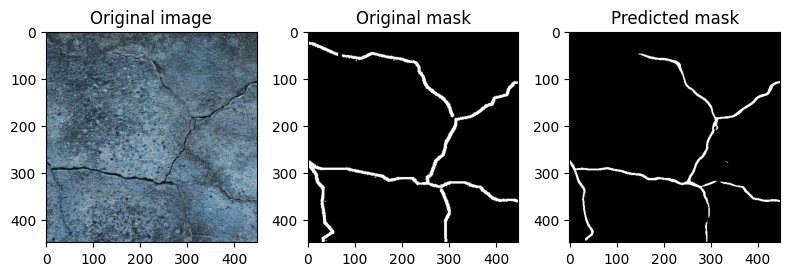

train_data visualize: loss:  0.010965308268088848
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


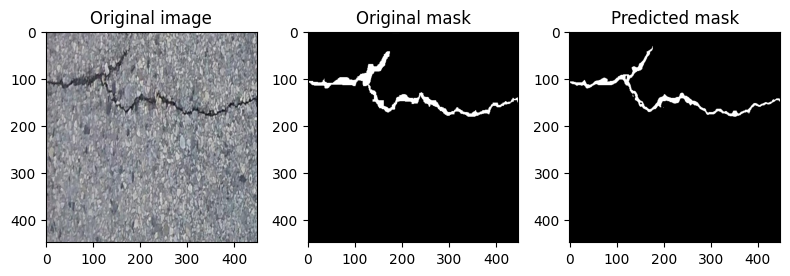

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


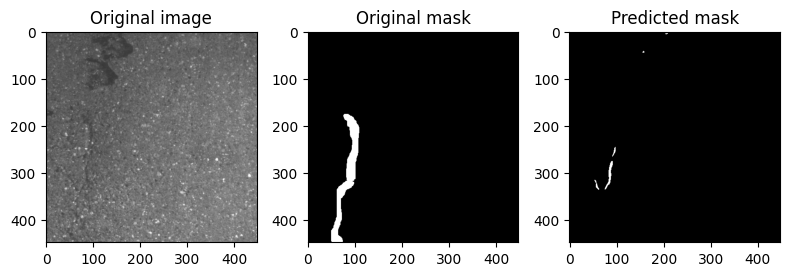

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564, 0.019499265335924255, 0.01709651308005479, 0.01512895575535249, 0.013621432373557634, 0.012963507075158014, 0.01257929287423054, 0.011458893921945578, 0.010812934615357771], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219, 0.7358275226703505, 0.7535842105867417, 0.7696522017562293, 0.7931600233645943, 0.7919522185878056, 0.8057941691419943, 0.8058949148327839, 0.824332391585761], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138, 0.6250082099340796, 0.6429527971318098, 0.6651473568706978, 0.6915467737651453, 0.6936000367490257, 0.7089014441017213, 0.7116536901188575, 0.7352124285407182], 'precision': [0.07759041904503876, 0.43740106492144304, 0.4566697420749238, 0.4747761586696152, 0.503796447704478, 0.5158978577370081, 0.5493883933962845, 0.546744680198712

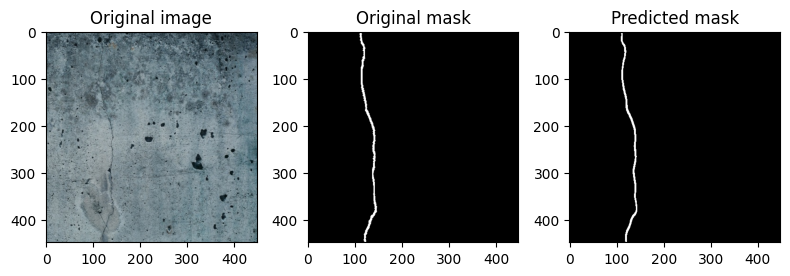

Epoch 14/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.010760929440148176
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


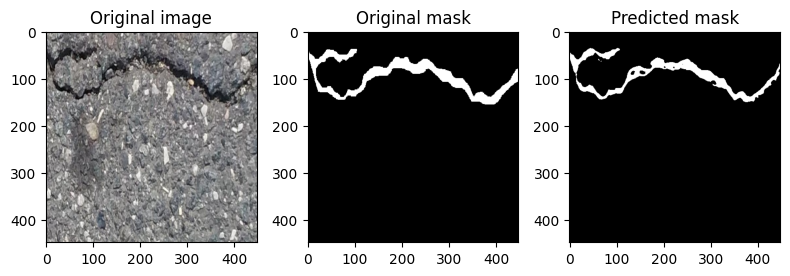

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


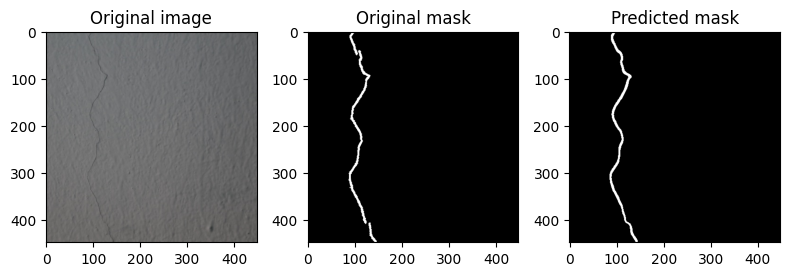

train_data visualize: loss:  0.010572060483740642
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


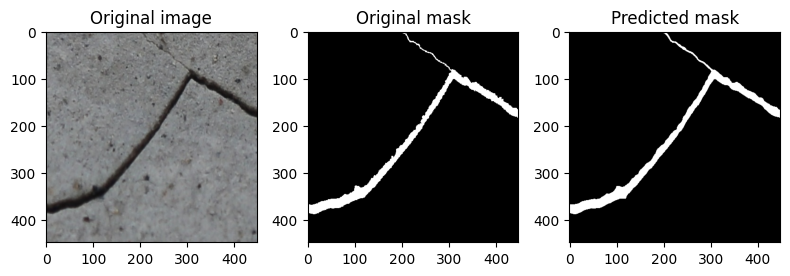

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


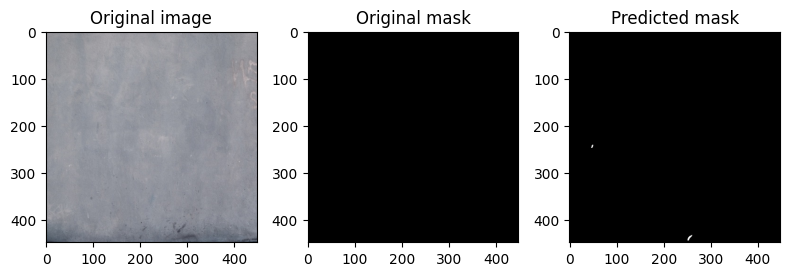

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564, 0.019499265335924255, 0.01709651308005479, 0.01512895575535249, 0.013621432373557634, 0.012963507075158014, 0.01257929287423054, 0.011458893921945578, 0.010812934615357771, 0.010632968640117719], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219, 0.7358275226703505, 0.7535842105867417, 0.7696522017562293, 0.7931600233645943, 0.7919522185878056, 0.8057941691419943, 0.8058949148327839, 0.824332391585761, 0.8235419940173141], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138, 0.6250082099340796, 0.6429527971318098, 0.6651473568706978, 0.6915467737651453, 0.6936000367490257, 0.7089014441017213, 0.7116536901188575, 0.7352124285407182, 0.7341787719387349], 'precision': [0.07759041904503876, 0.43740106492144304, 0.4566697420749238, 0.4747761586696152, 0.503796447704

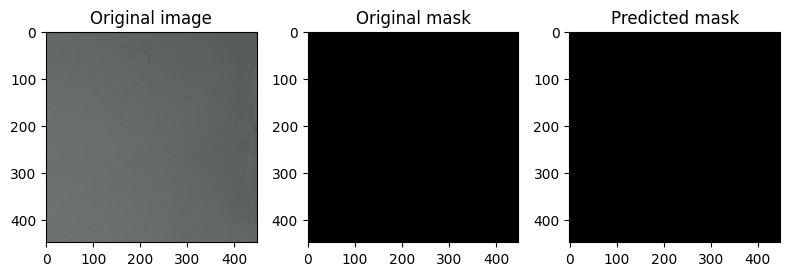

Epoch 15/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.009750168238533662
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


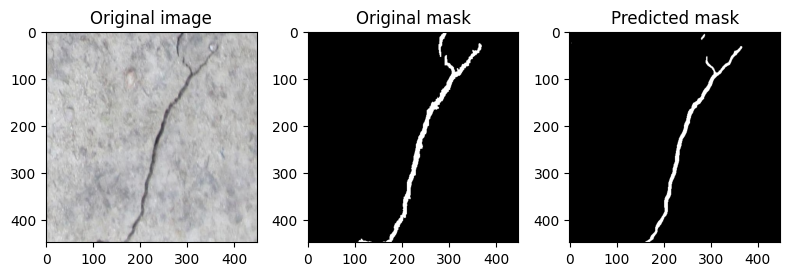

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


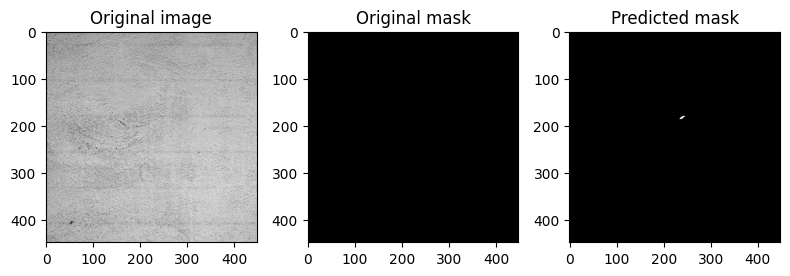

train_data visualize: loss:  0.009447627598652615
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


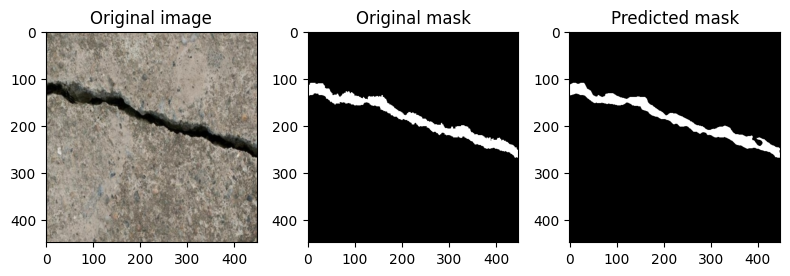

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


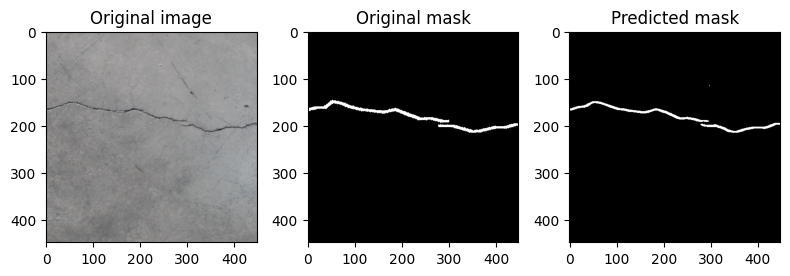

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564, 0.019499265335924255, 0.01709651308005479, 0.01512895575535249, 0.013621432373557634, 0.012963507075158014, 0.01257929287423054, 0.011458893921945578, 0.010812934615357771, 0.010632968640117719, 0.009653844260345629], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219, 0.7358275226703505, 0.7535842105867417, 0.7696522017562293, 0.7931600233645943, 0.7919522185878056, 0.8057941691419943, 0.8058949148327839, 0.824332391585761, 0.8235419940173141, 0.8495013030563913], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138, 0.6250082099340796, 0.6429527971318098, 0.6651473568706978, 0.6915467737651453, 0.6936000367490257, 0.7089014441017213, 0.7116536901188575, 0.7352124285407182, 0.7341787719387349, 0.7648567159970602], 'precision': [0.07759041904503876, 0.43740106492

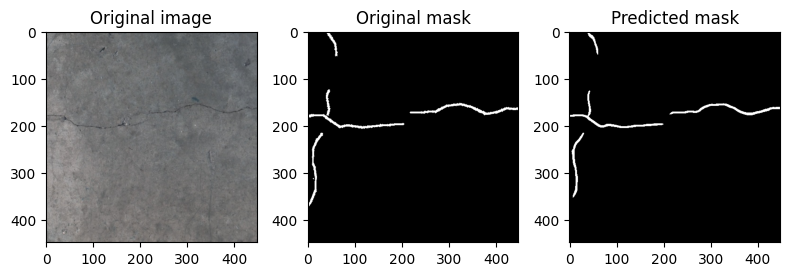

Epoch 16/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.009901430196361615
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


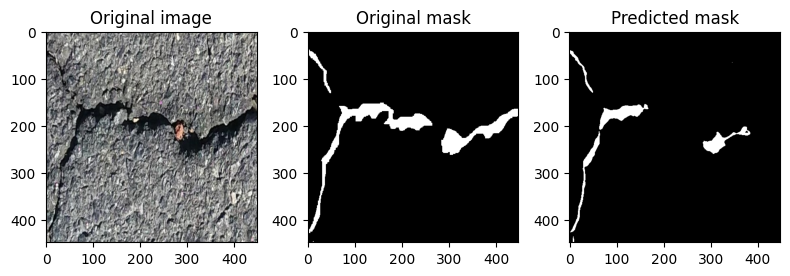

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


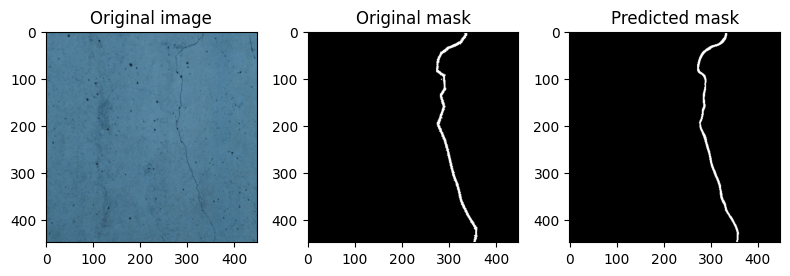

train_data visualize: loss:  0.009615674624568783
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


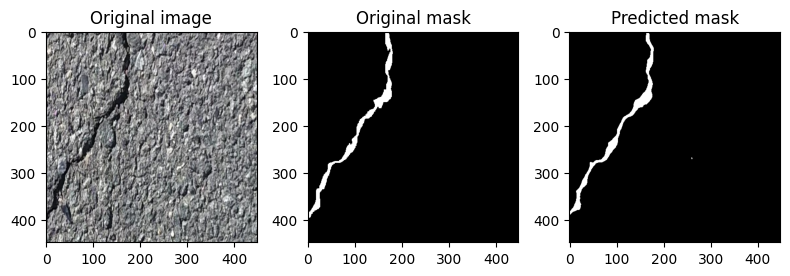

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


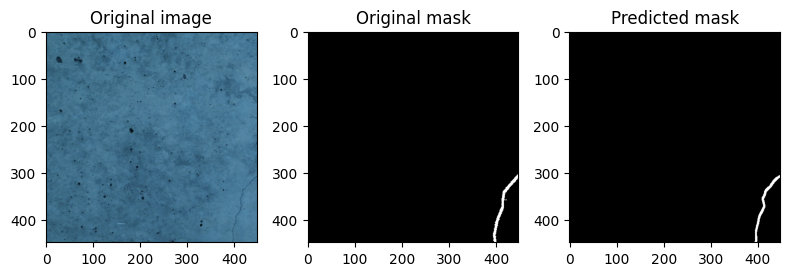

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564, 0.019499265335924255, 0.01709651308005479, 0.01512895575535249, 0.013621432373557634, 0.012963507075158014, 0.01257929287423054, 0.011458893921945578, 0.010812934615357771, 0.010632968640117719, 0.009653844260345629, 0.009724402279504085], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219, 0.7358275226703505, 0.7535842105867417, 0.7696522017562293, 0.7931600233645943, 0.7919522185878056, 0.8057941691419943, 0.8058949148327839, 0.824332391585761, 0.8235419940173141, 0.8495013030563913, 0.8504943530249401], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138, 0.6250082099340796, 0.6429527971318098, 0.6651473568706978, 0.6915467737651453, 0.6936000367490257, 0.7089014441017213, 0.7116536901188575, 0.7352124285407182, 0.7341787719387349, 0.7648567159970602, 0.76675

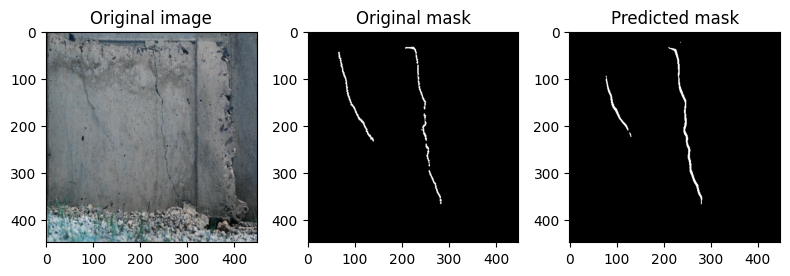

Epoch 17/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.008723542007923243
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


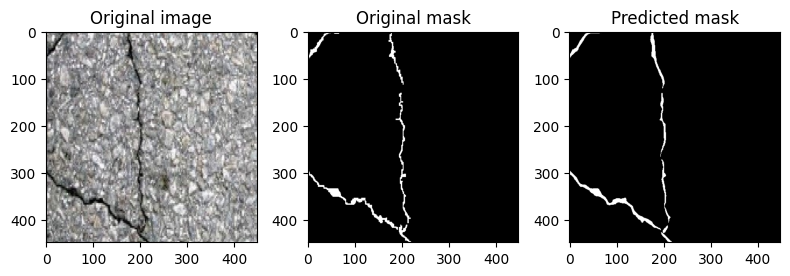

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


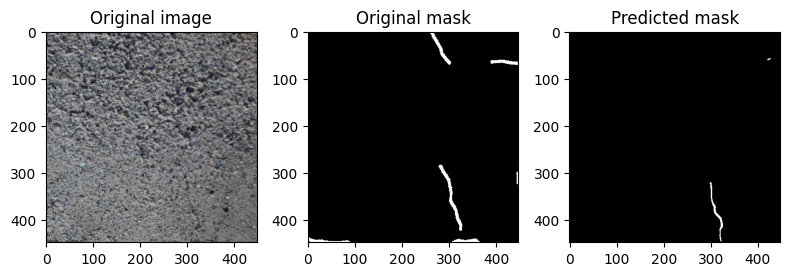

train_data visualize: loss:  0.008692922976333648
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


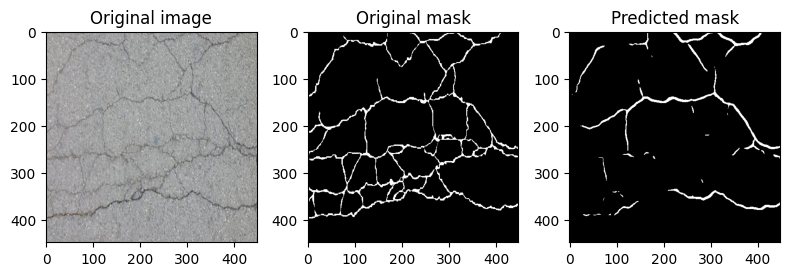

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


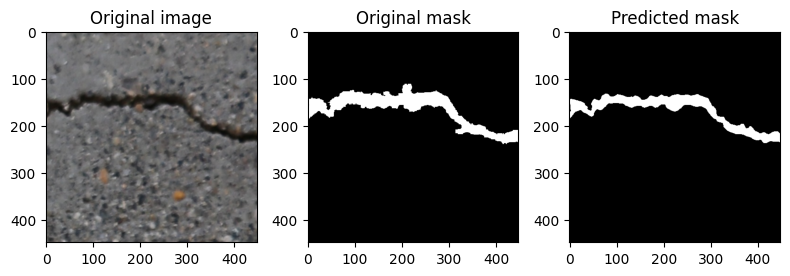

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564, 0.019499265335924255, 0.01709651308005479, 0.01512895575535249, 0.013621432373557634, 0.012963507075158014, 0.01257929287423054, 0.011458893921945578, 0.010812934615357771, 0.010632968640117719, 0.009653844260345629, 0.009724402279504085, 0.008819131689061925], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219, 0.7358275226703505, 0.7535842105867417, 0.7696522017562293, 0.7931600233645943, 0.7919522185878056, 0.8057941691419943, 0.8058949148327839, 0.824332391585761, 0.8235419940173141, 0.8495013030563913, 0.8504943530249401, 0.8600692945282634], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138, 0.6250082099340796, 0.6429527971318098, 0.6651473568706978, 0.6915467737651453, 0.6936000367490257, 0.7089014441017213, 0.7116536901188575, 0.7352124285407182, 0.734

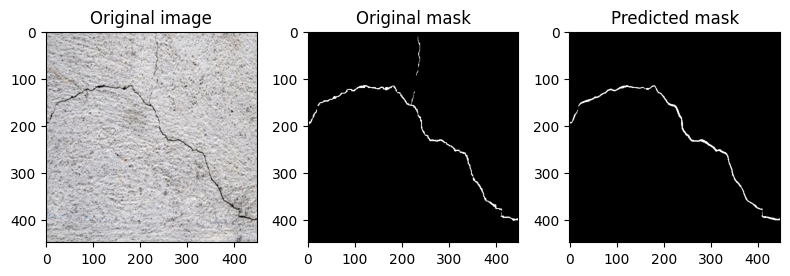

Epoch 18/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.007990070011466741
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


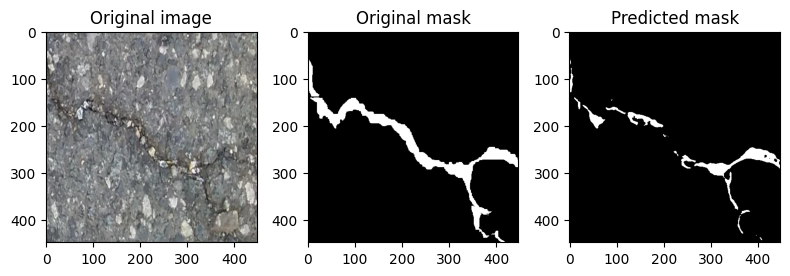

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


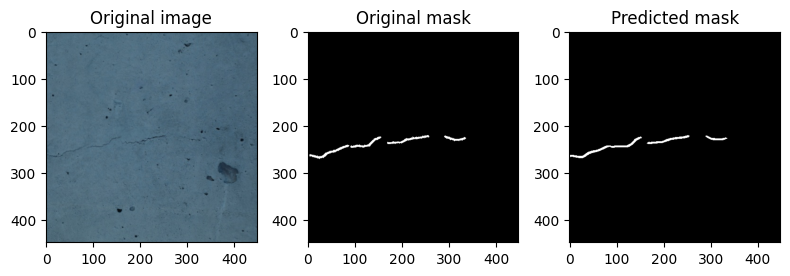

train_data visualize: loss:  0.007836422610453156
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


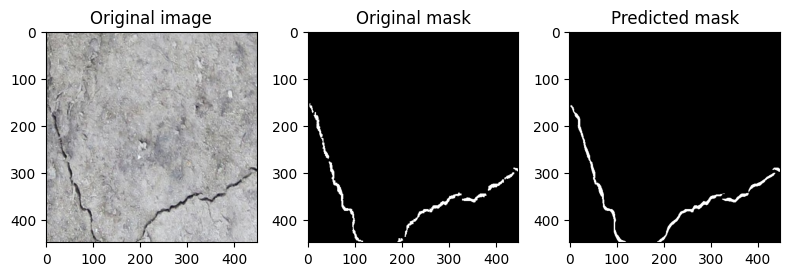

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


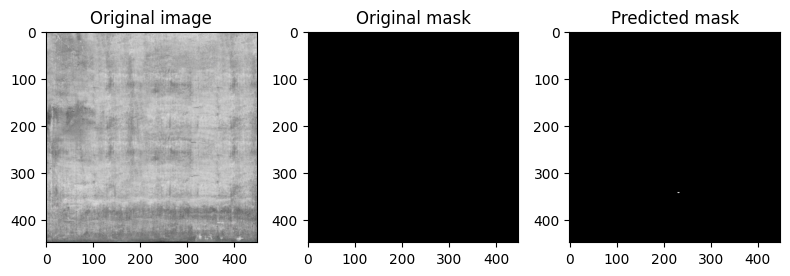

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564, 0.019499265335924255, 0.01709651308005479, 0.01512895575535249, 0.013621432373557634, 0.012963507075158014, 0.01257929287423054, 0.011458893921945578, 0.010812934615357771, 0.010632968640117719, 0.009653844260345629, 0.009724402279504085, 0.008819131689061925, 0.007881808073009195], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219, 0.7358275226703505, 0.7535842105867417, 0.7696522017562293, 0.7931600233645943, 0.7919522185878056, 0.8057941691419943, 0.8058949148327839, 0.824332391585761, 0.8235419940173141, 0.8495013030563913, 0.8504943530249401, 0.8600692945282634, 0.8730211018062219], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138, 0.6250082099340796, 0.6429527971318098, 0.6651473568706978, 0.6915467737651453, 0.6936000367490257, 0.7089014441017213, 0.7

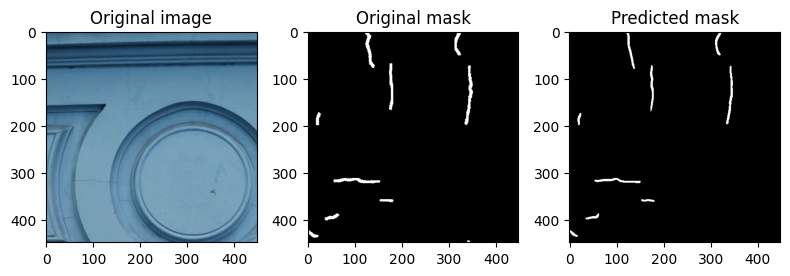

Epoch 19/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.007665492034837371
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


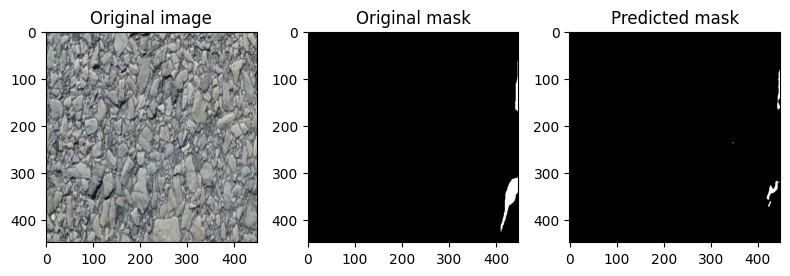

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


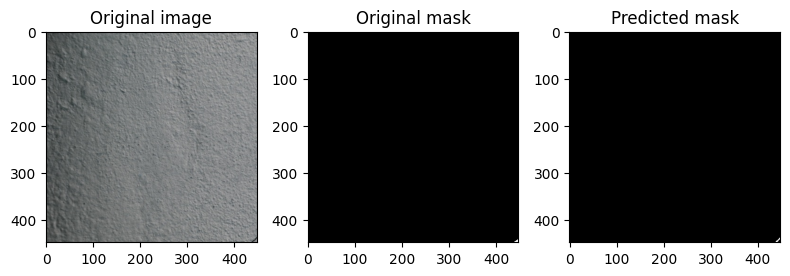

train_data visualize: loss:  0.0074383525890298185
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


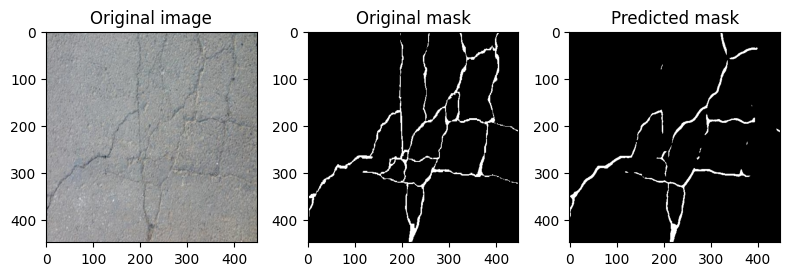

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


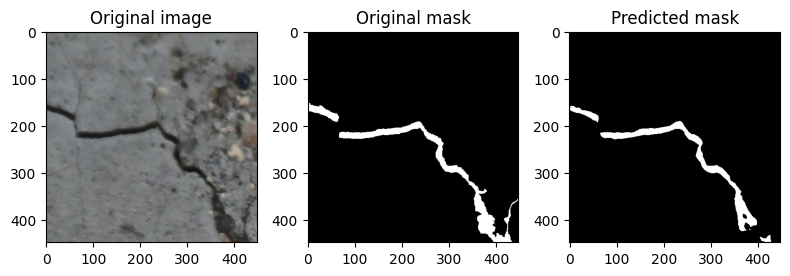

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564, 0.019499265335924255, 0.01709651308005479, 0.01512895575535249, 0.013621432373557634, 0.012963507075158014, 0.01257929287423054, 0.011458893921945578, 0.010812934615357771, 0.010632968640117719, 0.009653844260345629, 0.009724402279504085, 0.008819131689061925, 0.007881808073009195, 0.007548842806124404], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219, 0.7358275226703505, 0.7535842105867417, 0.7696522017562293, 0.7931600233645943, 0.7919522185878056, 0.8057941691419943, 0.8058949148327839, 0.824332391585761, 0.8235419940173141, 0.8495013030563913, 0.8504943530249401, 0.8600692945282634, 0.8730211018062219, 0.8768223795464368], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138, 0.6250082099340796, 0.6429527971318098, 0.6651473568706978, 0.6915467737651453, 0

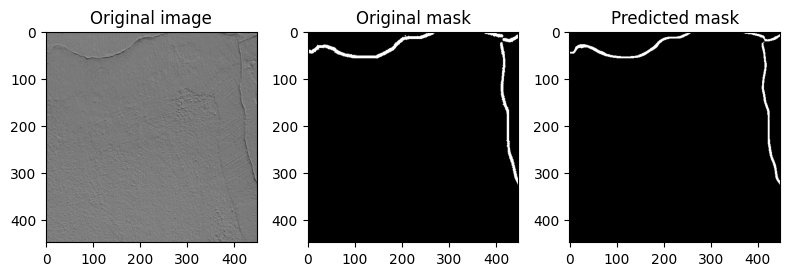

Epoch 20/20


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.0072377293833997105
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


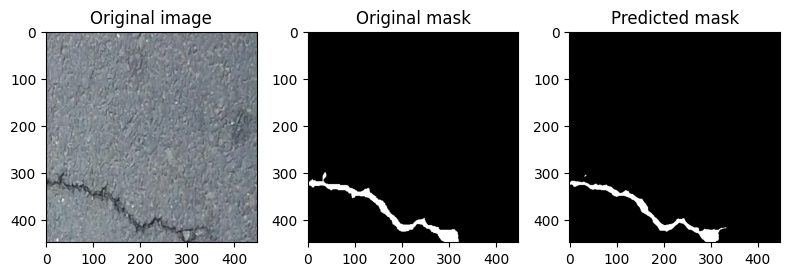

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


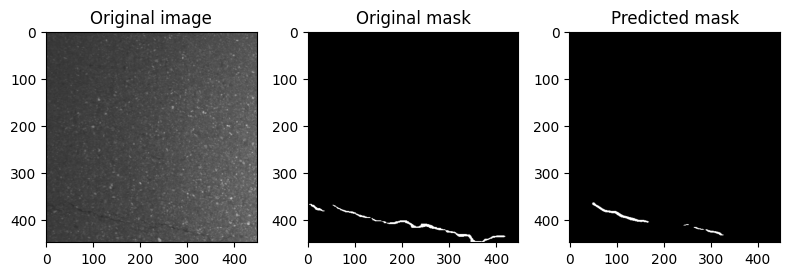

train_data visualize: loss:  0.0073282699885312465
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


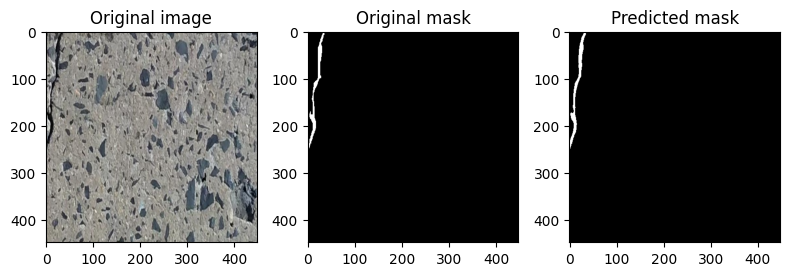

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)


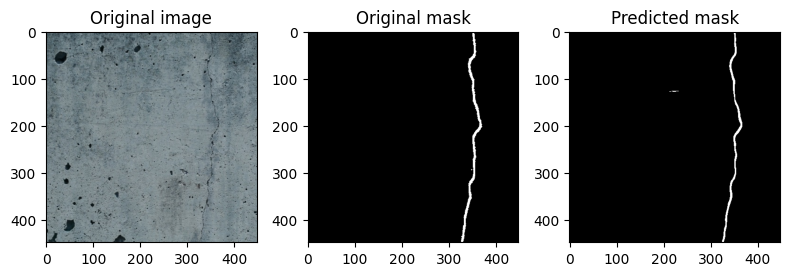

{'loss': [0.30735097105910136, 0.10334037492975473, 0.05002031999269151, 0.03172828121398523, 0.023827190462469564, 0.019499265335924255, 0.01709651308005479, 0.01512895575535249, 0.013621432373557634, 0.012963507075158014, 0.01257929287423054, 0.011458893921945578, 0.010812934615357771, 0.010632968640117719, 0.009653844260345629, 0.009724402279504085, 0.008819131689061925, 0.007881808073009195, 0.007548842806124404, 0.007356348848140732], 'dice': [0.26133714140391895, 0.6268709508505294, 0.6666212570134217, 0.6954905826870988, 0.7169655841298219, 0.7358275226703505, 0.7535842105867417, 0.7696522017562293, 0.7931600233645943, 0.7919522185878056, 0.8057941691419943, 0.8058949148327839, 0.824332391585761, 0.8235419940173141, 0.8495013030563913, 0.8504943530249401, 0.8600692945282634, 0.8730211018062219, 0.8768223795464368, 0.884632010043152], 'iou': [0.2367171083736368, 0.512404073241765, 0.5502045381117643, 0.5796143474375329, 0.6006158094217138, 0.6250082099340796, 0.6429527971318098, 

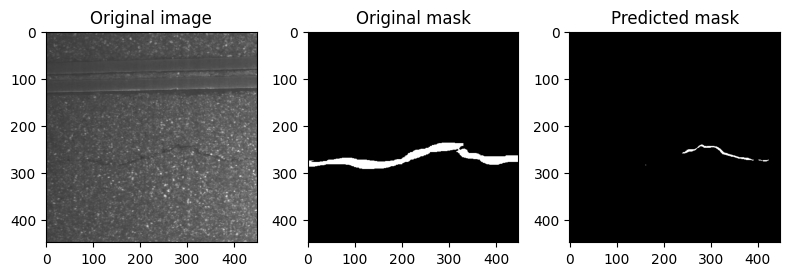

In [108]:
model=model.to(device)
# criterion= torchvision.ops.sigmoid_focal_loss
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)  # if unfreeze=True -> 1e-4, 1e-5, so not to ruin good init w
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, min_lr=1e-6, factor=0.1)
early = EarlyStopping()


# Loss function and optimizer
criterion = nn.BCEWithLogitsLoss()


# Define dictionaries to store per-epoch average loss and metrics
training_metrics = {
    'loss': [],
    'dice': [],
    'iou': [],
    'precision': [],
    'recall': [],
    'f1_score': [],
}

validation_metrics = {
    'loss': [],
    'dice': [],
    'iou': [],
    'precision': [],
    'recall': [],
    'f1_score': [],
}

# Training loop
for epoch in range(epochs):
    
    model.train()
    running_loss = 0.0
    running_500_loss=0.0
    epoch_loss = 0.0
    training_metrics_epoch = {
        'loss': [],
        'dice': [],
        'iou': [],
        'precision': [],
        'recall': [],
        'f1_score': [],
    }
    print(f'Epoch {epoch + 1}/{epochs}')
    for batch_idx, (inputs, targets) in enumerate(tqdm(train_dataloader, leave=False)):
        inputs = inputs.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        epoch_loss += loss.item()
        running_500_loss+=loss.item()

        # Calculate metrics for training after every 10th batch
        if (batch_idx +1 )% 500 == 0:
            
            random_number = np.random.randint(1, len(df_valid) + 1)
            
            print("train_data visualize: loss: ",running_500_loss/500)
            validate_test_image(model, df_train,random_number)
            print("valid_data visualize: ")
            validate_test_image(model, df_valid,random_number)
            running_500_loss=0.0
        if (batch_idx + 1) % 5 == 0:
            avg_loss = running_loss / 5  # Average loss for the last 10 batches
            running_loss = 0.0  # Reset the running loss

            # Calculate and store training metrics using find_metrics
            metrics = find_metrics(outputs, targets)  # Adjust threshold if needed
            training_metrics_epoch['loss'].append(avg_loss)
            training_metrics_epoch['dice'].append(metrics['dice'].cpu().item())
            training_metrics_epoch['iou'].append(metrics['iou'].cpu().item())
            training_metrics_epoch['precision'].append(metrics['precision'].cpu().item())
            training_metrics_epoch['recall'].append(metrics['recall'].cpu().item())
            training_metrics_epoch['f1_score'].append(metrics['f1_score'].cpu().item())
            
            
            

        
            

    # Calculate the average metrics for this epoch's training batches
    for key, value in training_metrics_epoch.items():
        if value:
            training_metrics[key].append(np.mean(value))
    print(training_metrics)
    
    # Calculate and store the average loss for this epoch
#     training_metrics['loss'].append(epoch_loss / len(train_dataloader))
    print(f"training_loss: {epoch_loss / len(train_dataloader):.5f}")
    print(f"training_iou: {training_metrics['iou'][-1]:.5f}")
    print(f"training_dice: {training_metrics['dice'][-1]:.5f}")
    # Calculate validation metrics every 5 epochs
    avg_loss=0.0
    if (epoch + 1) % 1 == 0:
        model.eval()
        validation_loss = 0.0
        validation_metrics_epoch = {
            'loss': [],
            'dice': [],
            'iou': [],
            'precision': [],
            'recall': [],
            'f1_score': [],
        }

        for val_inputs, val_targets in valid_dataloader:
            val_inputs = val_inputs.to(device)
            val_targets = val_targets.to(device)

            val_outputs = model(val_inputs)
            val_loss = criterion(val_outputs, val_targets)
            validation_loss += val_loss.item()

            # Calculate and store validation metrics using find_metrics
            val_metrics = find_metrics(val_outputs, val_targets)  # Adjust threshold if needed
            validation_metrics_epoch['loss'].append(val_loss.item())
            validation_metrics_epoch['dice'].append(val_metrics['dice'].cpu().item())
            validation_metrics_epoch['iou'].append(val_metrics['iou'].cpu().item())
            validation_metrics_epoch['precision'].append(val_metrics['precision'].cpu().item())
            validation_metrics_epoch['recall'].append(val_metrics['recall'].cpu().item())
            validation_metrics_epoch['f1_score'].append(val_metrics['f1_score'].cpu().item())
            
            

           

        avg_validation_loss = validation_loss / len(valid_dataloader)
        avg_loss=avg_validation_loss


        # Calculate the average metrics for this epoch's validation batches
        for key, value in validation_metrics_epoch.items():
            if value:
                validation_metrics[key].append(np.mean(value))

        # Store the average loss for this epoch
#         validation_metrics['loss'].append(avg_validation_loss)

        print(validation_metrics)
        print(f'Validation loss: {avg_validation_loss:.4f}')
        print(f'Validation iou: {validation_metrics["iou"][-1]:.4f}')
        print(f'Validation dice: {validation_metrics["dice"][-1]:.4f}')
        scheduler.step(avg_loss)
#         early(avg_loss, model=model)
#         if early.early_stop:
#             print(f'Validation loss did not improve for {early.patience} epochs. Training stopped.')
#             model.load_state_dict(torch.load(path))
#             break
        #         print("training_loss",validaion_metrics['loss'][epoch])
#         print("validation_iou",validation_metrics['iou'][epoch])
#         print("validation_dice",validation_metrics['dice'][epoch])

    if (epoch + 1) % 1 == 0:
        
            validate_test_image(model, df_valid)

    if (epoch + 1) == 3:
    # Define the path where you want to save the model
        model_path = "seg_model_"+str(epoch+1)+".pth"

        # Save the model's state_dict
#         torch.save(model.state_dict(), model_path)

        print(f'Model saved after 3 epochs to {model_path}')
    torch.cuda.empty_cache()   

# Scheduler step (if using a learning rate scheduler)
 # Step based on the last validation loss


In [ ]:
len(valid_dataloader)

In [109]:
model_path_new='best_model_unetvgg_20.pth'

In [110]:
validation_metrics

{'loss': [0.15636860197456323,
  0.06303978652058549,
  0.03655342522322835,
  0.026306449412484074,
  0.022244201984664248,
  0.019157278850160317,
  0.017686949848818283,
  0.016345793439541012,
  0.014837655887779182,
  0.015672461684797287,
  0.014894253325083037,
  0.015125351319701582,
  0.01446547572695138,
  0.01472808894900323,
  0.014733489553795541,
  0.015271147782842848,
  0.014955119152951078,
  0.014703270263797193,
  0.014664116182540233,
  0.014890263883573234],
 'dice': [0.6721399084697315,
  0.6903245740590979,
  0.6994261386559868,
  0.7417420549958189,
  0.6954070676780718,
  0.736205856839371,
  0.7400834214692907,
  0.7608315429732201,
  0.7721660872704155,
  0.7750144111055103,
  0.7967489056882278,
  0.7721282038768169,
  0.7991833180949017,
  0.799282356244118,
  0.7940597427610437,
  0.8113915892086219,
  0.8028691220954431,
  0.8126321014628481,
  0.8170802832316997,
  0.815060551672136],
 'iou': [0.5587103096443918,
  0.5802612996394328,
  0.589193216991258

In [111]:
torch.save(model.state_dict(),model_path_new )

In [ ]:
def save_model(epochs, model, optimizer, criterion):
    """
    Function to save the trained model to disk.
    """
    print(f"Saving final model...")
    torch.save({
                'epoch': epochs,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'loss': criterion,
                }, 'model_unetvgg_20_opt_model_epoch.pth')

In [ ]:
criterion,optimizer,epochs

In [ ]:
save_model(epochs, model, optimizer, criterion)

In [ ]:
os.listdir('/kaggle/working/')

In [112]:
import torch

allocated_memory = torch.cuda.memory_allocated()
cached_memory = torch.cuda.memory_cached()

print(f'Allocated GPU memory: {allocated_memory / (1024**2):.2f} MB')
print(f'Cached GPU memory: {cached_memory / (1024**2):.2f} MB')



Allocated GPU memory: 4779.85 MB
Cached GPU memory: 6726.00 MB


In [ ]:
torch.cuda.empty_cache()

In [ ]:
print(training_metrics)

In [ ]:
print(validation_metrics)

In [ ]:
# masks=test[1]
# threshold=0.6
# outputs_pred = torch.sigmoid(output[0])
# y_pred = (outputs_pred > threshold).float()

# intersection = torch.logical_and(y_pred, masks)
# union = torch.logical_or(y_pred, masks)

# iou1= (torch.sum(intersection)+1e-15) / (torch.sum(union) + 1e-15)
# dice1 = (2 * torch.sum(intersection)+1e-15)/ (torch.sum(y_pred) + torch.sum(masks) + 1e-15)
# # precision1 = (torch.sum(intersection)+1e-15) / (torch.sum(y_pred) + 1e-15)
# # recall1 = (torch.sum(intersection)+1e-5) / (torch.sum(masks) + 1e-15)
# precision1=precision_tesnor(y_pred,masks)
# recall1=recall_tensor(y_pred,masks)
# f11 = (2 * precision1* recall1) / (precision1 + recall1)

In [113]:
metrics=None
model=model.to(device)
for i in train_dataloader:
    model.eval()
    inputs,masks=i
    inputs=inputs.to(device)
    masks=masks.to(device)
    outputs=model(inputs)
    metrics=find_metrics(outputs,masks)
    break
    
# model = model.to(device)



In [ ]:
metrics['dice'].cpu().item()

In [ ]:
# outputs=None
# predicted=None
# for _, batch in enumerate(tqdm(train_dataloader, leave=False)):
#             model.eval()
#             inputs = batch[0]
#             targets = batch[1]

#             outputs = model(inputs)
#             _, predicted = torch.max(outputs, 1)
#             break

In [ ]:
outputs.shape

In [ ]:
predicted.shape

In [ ]:
accuracy_score(y_true,y_pred)

In [ ]:
torch.save()

In [ ]:
print(validation_metrics)

In [ ]:
print(training_metrics)

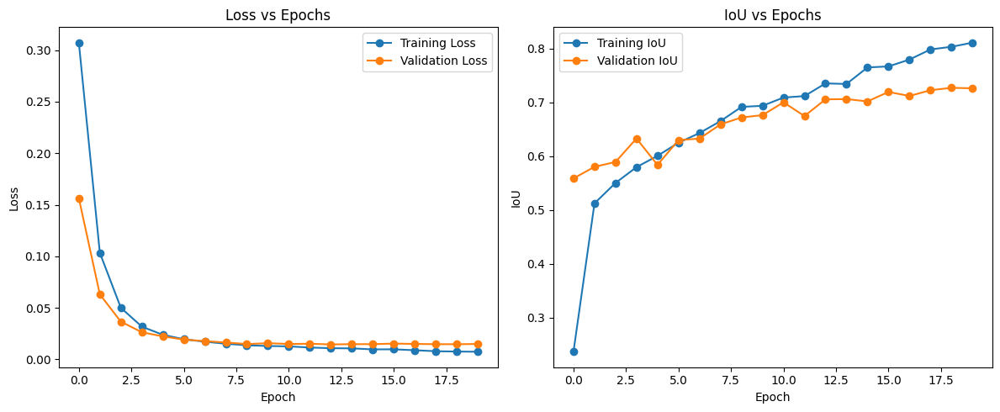

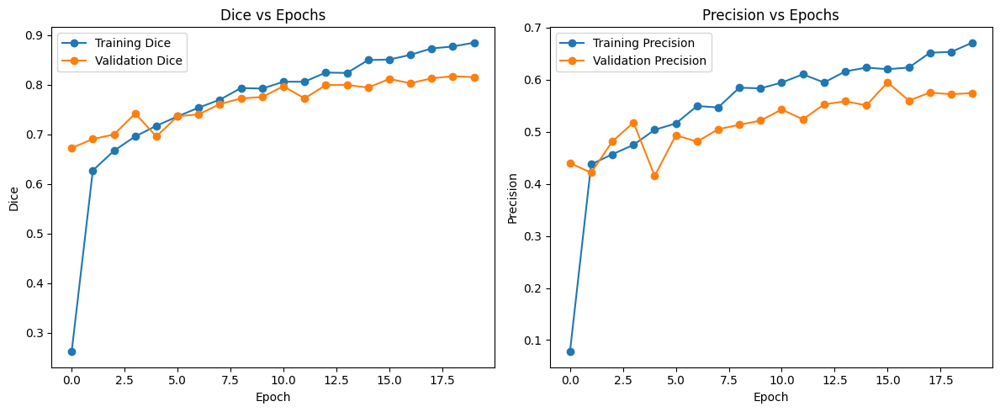

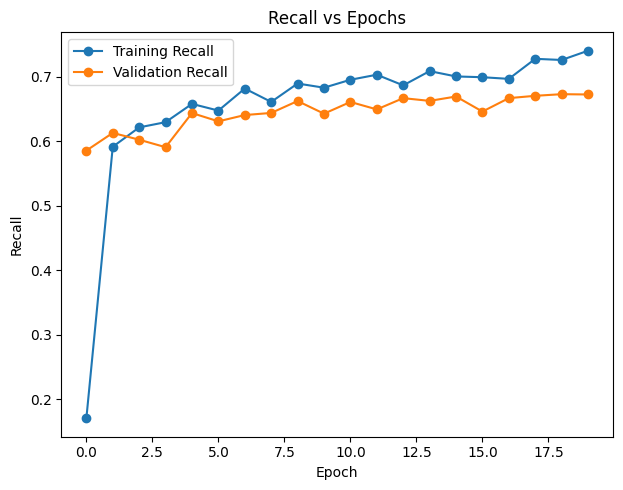

In [116]:
import matplotlib.pyplot as plt

# Assuming you have stored your metrics as dictionaries
# training_metrics and validation_metrics

# Extract the metrics
train_loss = training_metrics['loss']
train_iou = training_metrics['iou']
train_dice = training_metrics['dice']
train_precision = training_metrics['precision']
train_recall = training_metrics['recall']

val_loss = validation_metrics['loss']
val_iou = validation_metrics['iou']
val_dice = validation_metrics['dice']
val_precision = validation_metrics['precision']
val_recall = validation_metrics['recall']

# Create plots for Loss vs Epochs
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(len(train_loss)), train_loss, label='Training Loss', marker='o')
plt.plot(range(len(val_loss)) ,val_loss, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epochs')
plt.legend()

# Create plots for IoU vs Epochs
plt.subplot(1, 2, 2)
plt.plot(range(len(train_iou)), train_iou, label='Training IoU', marker='o')
plt.plot( range(len(val_iou)),val_iou, label='Validation IoU', marker='o')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.title('IoU vs Epochs')
plt.legend()

plt.tight_layout()
plt.show()

# Create plots for Dice vs Epochs
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(len(train_dice)), train_dice, label='Training Dice', marker='o')
plt.plot(range(len(val_dice)),val_dice, label='Validation Dice', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.title('Dice vs Epochs')
plt.legend()

# Create plots for Precision vs Epochs
plt.subplot(1, 2, 2)
plt.plot(range(len(train_precision)), train_precision, label='Training Precision', marker='o')
plt.plot(range(len(val_precision)), val_precision, label='Validation Precision', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.title('Precision vs Epochs')
plt.legend()

plt.tight_layout()
plt.show()

# Create plots for Recall vs Epochs
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(len(train_recall)), train_recall, label='Training Recall', marker='o')
plt.plot(range(len(val_recall) ), val_recall, label='Validation Recall', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.title('Recall vs Epochs')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
# model2 = UNET()
# model2.load_state_dict(torch.load('/kaggle/working/best_model_unet_20.pth'))
# # model.eval()

In [ ]:
# model2=model2.to(device)
# validate_test_image(model2,df_valid)